# Chapter 12
## Forecasting Using Supervised Machine Learning


# Technical Requirements

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# import warnings
# warnings.filterwarnings('ignore')



In [4]:
import sktime
import statsmodels as sm
import matplotlib 
import sklearn

print(f'''
sktime ->  {sktime.__version__}
Matplotlib -> {matplotlib.__version__}
pandas -> {pd.__version__}   
numpy -> {np.__version__}
sklearn -> {sklearn.__version__}
statsmodels -> {sm.__version__}
''')

In [5]:
plt.rcParams["figure.figsize"] = [12, 5]  
plt.style.use('grayscale')

In [ ]:
# ###### configurations for image quality#######
# plt.rcParams["figure.figsize"] = [14, 5]   ##
# # plt.rcParams['figure.dpi'] = 300           ## 300 for printing
# plt.rc('font', size=8)                     ## 
# plt.rc('axes', titlesize=16)               ## 
# plt.rc('axes', labelsize=14)               ##
# plt.rc('xtick', labelsize=10)              ##
# plt.rc('ytick', labelsize=10)              ##
# plt.rc('legend', fontsize=10)              ##
# plt.rc('figure', titlesize=12)             ## 
# #############################################

#### Load the datasets

In [6]:
path = Path('../../datasets/Ch12/')
daily_temp = pd.read_csv(path.joinpath('daily_weather.csv'), 
                      index_col='DateTime', 
                      parse_dates=True)
daily_temp.columns = ['y']
energy = pd.read_csv(path.joinpath('energy_consumption.csv'), 
                     index_col='Month', 
                     parse_dates=True)
energy.columns = ['y']

air = pd.read_csv(path.joinpath('air_passenger.csv'), 
                  index_col='date', 
                  parse_dates=True)
air.columns = ['y']

In [7]:
display(daily_temp.tail())
display(energy.tail())
display(air.tail())

,y
DateTime,
2016-12-28,4.887153
2016-12-29,2.676250
2016-12-30,-1.706597
2016-12-31,-2.492500
2017-01-01,-4.820000


,y
Month,
2021-08-01,1755.212
2021-09-01,1456.901
2021-10-01,1315.799
2021-11-01,1644.306
2021-12-01,2032.352


,y
date,
1960-08-31,606
1960-09-30,508
1960-10-31,461
1960-11-30,390
1960-12-31,432


In [8]:
air.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 144 entries, 1949-01-31 to 1960-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   y       144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB


In [9]:
daily_temp.index.freq = 'D'
energy.index.freq = 'MS'
air.index.freq = 'ME'

In [10]:
print(daily_temp.index.freq)
print(energy.index.freq)
print(air.index.freq)

<Day>
<MonthBegin>
<MonthEnd>


<Axes: title={'center': 'Monthly Passengers'}, xlabel='date'>

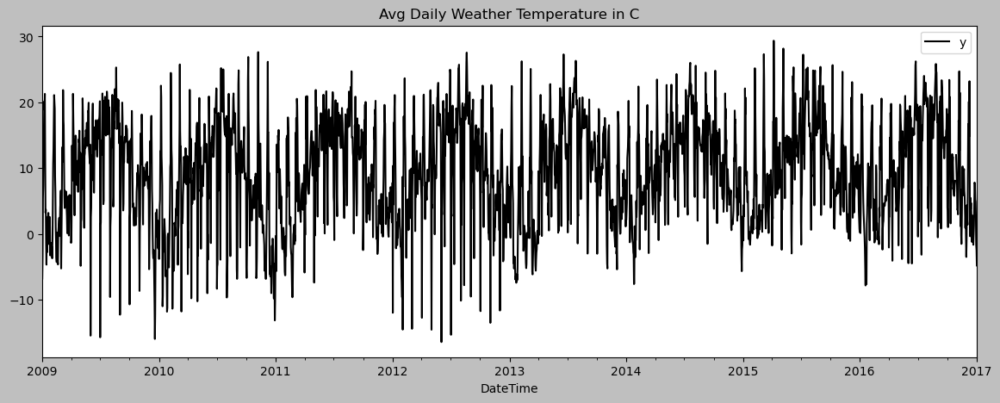

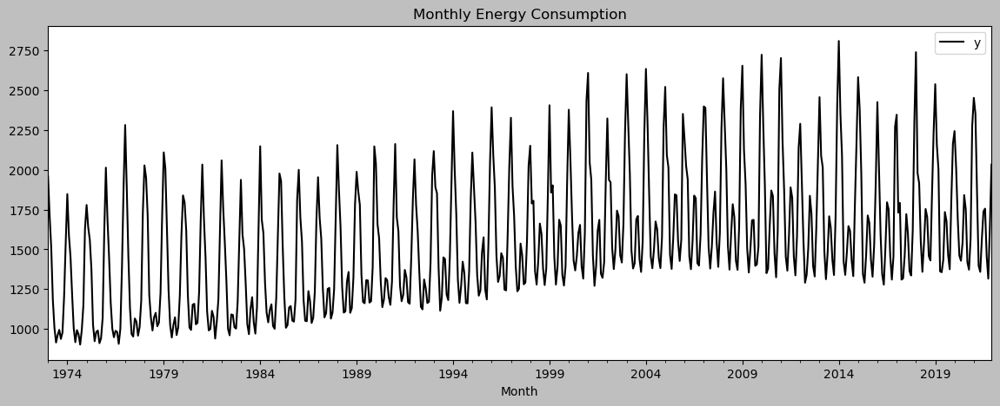

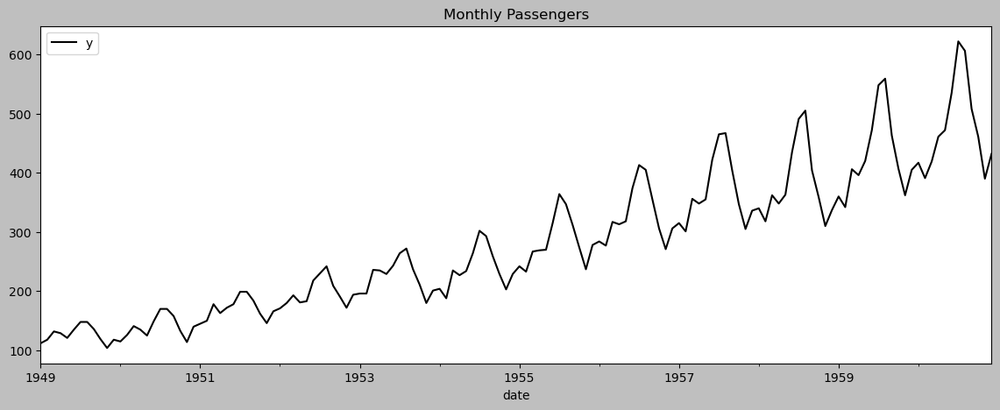

In [10]:
plt.rcParams["figure.figsize"] = [14, 5]  
daily_temp.plot(title='Avg Daily Weather Temperature in C')
energy.plot(title='Monthly Energy Consumption')
air.plot(title='Monthly Passengers')

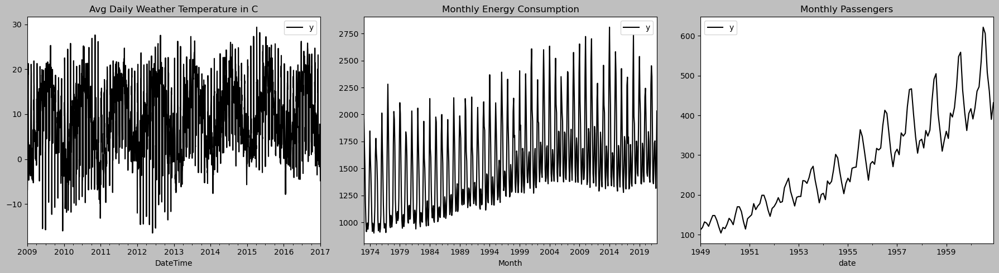

In [11]:
plt.rcParams["figure.figsize"] = [18, 5]  
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

daily_temp.plot(ax=ax1, title='Avg Daily Weather Temperature in C')
energy.plot(ax=ax2, title='Monthly Energy Consumption')
air.plot(ax=ax3, title='Monthly Passengers')

plt.tight_layout()
plt.show()

# Recipe 1. Preparing Time Series Data for Supervised Learning

In [12]:
air_copy = air.copy()
energy_copy = energy.copy()
daily_temp_copy = daily_temp.copy()

In [13]:
def handle_missing_data(df):
    n = df.isna().sum().values[0]
    if n > 0:
        print(f'found {n} missing observations...')
        df.ffill(inplace=True)

In [14]:
for df in [air_copy, energy_copy, daily_temp_copy]:
    handle_missing_data(df)

found 2 missing observations...


In [15]:
def generate_lagged_features(df, window):
    d = df.values.squeeze()
    x = np.lib.stride_tricks.sliding_window_view(d, window_shape=window)[:-1]
    y = d[window:]

    cols = [f'x_{i}' for i in range(1, window+1)]
    df_xs = pd.DataFrame(x, columns=cols, index=df.index[window:])
    df_y = pd.DataFrame(y, columns=['y'], index=df.index[window:])
    
    return pd.concat([df_xs, df_y], axis=1)

In [16]:
air_os = generate_lagged_features(air_copy, 5)
energy_os = generate_lagged_features(energy_copy, 5)
daily_temp_os = generate_lagged_features(daily_temp_copy, 5)
print(air_os.shape)
print(energy_os.shape)
print(daily_temp_os.shape)

(139, 6)
(583, 6)
(2918, 6)


In [17]:
#before transformation
display(air_copy.head(6))

# after transformation
display(air_os.head())

,y
date,
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
1949-06-30,135


,x_1,x_2,x_3,x_4,x_5,y
date,,,,,,
1949-06-30,112,118,132,129,121,135
1949-07-31,118,132,129,121,135,148
1949-08-31,132,129,121,135,148,148
1949-09-30,129,121,135,148,148,136
1949-10-31,121,135,148,148,136,119


In [18]:
print(air_copy.shape)
print(air_os.shape)

(144, 1)
(139, 6)


In [19]:
def split_data(df, test_split=0.10):
    n = int(len(df) * test_split)
    train, test = df[:-n], df[-n:]
    return train, test

In [20]:
train, test = split_data(air_os)
print(f'Train: {len(train)} Test: {len(test)}')

Train: 126 Test: 13


In [21]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(air_os, test_size=0.10, shuffle=False)

In [22]:
train, test = split_data(air_os)
print(f'Train: {len(train)} Test: {len(test)}')

Train: 126 Test: 13


In [23]:
class Standardize:
    def __init__(self):
        self.mu = None
        self.sigma = None

    def _transform(self, df):
        return (df - self.mu) / self.sigma

    def fit_transform(self, train, test):
        # Calculate mean and std on training data only
        self.mu = train.mean()
        self.sigma = train.std()
        
        # Standardize training and test sets
        train_s = self._transform(train)
        test_s = self._transform(test)
        return train_s, test_s

    def transform(self, df):
        # Apply transformation to any new data
        return self._transform(df)

    def inverse(self, df):
        # Inverse transformation for the whole DataFrame
        return (df * self.sigma) + self.mu

    def inverse_y(self, df):
        # Inverse transformation specifically for the first column (y)
        return (df * self.sigma.iloc[-1]) + self.mu.iloc[-1]


In [24]:
scaler = Standardize()
train_s, test_s = scaler.fit_transform(train, test)
train_s.head()

,x_1,x_2,x_3,x_4,x_5,y
date,,,,,,
1949-06-30,-1.430706,-1.368677,-1.231607,-1.274503,-1.370589,-1.260948
1949-07-31,-1.369917,-1.230502,-1.260433,-1.350705,-1.237345,-1.136689
1949-08-31,-1.228077,-1.260111,-1.337304,-1.217351,-1.113618,-1.136689
1949-09-30,-1.258471,-1.339068,-1.202780,-1.093522,-1.113618,-1.251390
1949-10-31,-1.339523,-1.200892,-1.077865,-1.093522,-1.227828,-1.413882


In [25]:
y_train_original = scaler.inverse_y(train_s['y'])
y_train_original

date
1949-06-30    135.0
1949-07-31    148.0
1949-08-31    148.0
1949-09-30    136.0
1949-10-31    119.0
              ...  
1959-07-31    548.0
1959-08-31    559.0
1959-09-30    463.0
1959-10-31    407.0
1959-11-30    362.0
Freq: ME, Name: y, Length: 126, dtype: float64

In [26]:
train_original = scaler.inverse(train_s)
train_original.head()

,x_1,x_2,x_3,x_4,x_5,y
date,,,,,,
1949-06-30,112.0,118.0,132.0,129.0,121.0,135.0
1949-07-31,118.0,132.0,129.0,121.0,135.0,148.0
1949-08-31,132.0,129.0,121.0,135.0,148.0,148.0
1949-09-30,129.0,121.0,135.0,148.0,148.0,136.0
1949-10-31,121.0,135.0,148.0,148.0,136.0,119.0


## There is more

In [27]:
df = daily_temp.copy()
# adding lagged features
df_lf = generate_lagged_features(df, window=5)

# adding additional date related features
df_lf['day_of_week'] = df_lf.index.dayofweek
df_lf['days_in_month'] = df_lf.index.days_in_month
df_lf['month_end'] = df_lf.index.is_month_end.astype(int)
df_lf['is_leap'] = df_lf.index.is_leap_year.astype(int)
df_lf['month'] = df_lf.index.month
df_lf.head()


,x_1,x_2,x_3,x_4,x_5,y,day_of_week,days_in_month,month_end,is_leap,month
DateTime,,,,,,,,,,,
2009-01-06,-6.810629,-3.360486,5.435694,7.283889,12.690069,15.201597,1,31,0,0,1
2009-01-07,-3.360486,5.435694,7.283889,12.690069,15.201597,20.121875,2,31,0,0,1
2009-01-08,5.435694,7.283889,12.690069,15.201597,20.121875,18.864792,3,31,0,0,1
2009-01-09,7.283889,12.690069,15.201597,20.121875,18.864792,21.289722,4,31,0,0,1
2009-01-10,12.690069,15.201597,20.121875,18.864792,21.289722,11.937847,5,31,0,0,1


# Recipe 2. One-Step Forecasting using Linear Regression Models with Scikit-Learn

## How to do it..

In [28]:
from sklearn.linear_model import (LinearRegression, 
                                 ElasticNet, 
                                 Ridge, 
                                 Lasso, 
                                 HuberRegressor)
from sklearn.ensemble import (RandomForestRegressor,
                             GradientBoostingRegressor,
                             ExtraTreesRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, root_mean_squared_error

In [29]:
air_cp = air.copy()
en_cp = energy.copy()
dw_cp = daily_temp.copy()

### Preprocessing Time Series Data

In [32]:
for df in [air_cp, en_cp, dw_cp]:
    handle_missing_data(df)

In [33]:
air_ml = generate_lagged_features(air_cp, 10)
en_ml = generate_lagged_features(en_cp, 10)
dw_ml = generate_lagged_features(dw_cp, 10)

In [34]:
print(air_ml.shape)
print(en_ml.shape)
print(dw_ml.shape)

(134, 11)
(578, 11)
(2913, 11)


In [35]:
from sktime.performance_metrics.forecasting import(
                                MeanAbsolutePercentageError, 
                                MeanSquaredError,
                                MeanAbsoluteScaledError,
                                MeanAbsoluteError)
mae = MeanAbsoluteError()
mse = MeanSquaredError()
mape = MeanAbsolutePercentageError()
mase = MeanAbsoluteScaledError()

In [36]:
def preprocess(df, split):
    train, test = split_data(df, test_split=split)
    scale = Standardize()
    train_s, test_s = scale.fit_transform(train,test)
    return train_s, test_s, scale

In [37]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


In [38]:
train_air, test_air, scale_air = preprocess(air_ml, split=0.10)
train_en, test_en, scale_en = preprocess(en_ml, split=0.10)
train_dw, test_dw, scale_dw = preprocess(dw_ml, split=0.10)

In [39]:
display(train_air.head())
display(test_air.head())

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,-1.417802,-1.380803,-1.254051,-1.304857,-1.406582,-1.274809,-1.142494,-1.141814,-1.271630,-1.456215,-1.629381
1949-12-31,-1.354719,-1.232956,-1.285631,-1.388829,-1.260410,-1.140749,-1.142494,-1.258494,-1.435360,-1.600611,-1.493826
1950-01-31,-1.207526,-1.264638,-1.369843,-1.241878,-1.124679,-1.140749,-1.262722,-1.423792,-1.579827,-1.465841,-1.522874
1950-02-28,-1.239067,-1.349122,-1.222472,-1.105425,-1.124679,-1.264497,-1.433044,-1.569642,-1.444991,-1.494720,-1.416366
1950-03-31,-1.323178,-1.201275,-1.085627,-1.105425,-1.249970,-1.439807,-1.583329,-1.433515,-1.473885,-1.388830,-1.271128


,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1959-12-31,1.000377,1.660612,1.524958,1.749612,2.258160,2.984186,2.975303,1.921050,1.338412,0.883005,1.285052
1960-01-31,1.673262,1.555007,1.777595,2.295428,3.051665,3.097621,2.013482,1.376541,0.905010,1.296941,1.401242
1960-02-29,1.568124,1.808458,2.324976,3.093159,3.166515,2.107637,1.452420,0.938989,1.319149,1.412458,1.149497
1960-03-31,1.820455,2.357603,3.124993,3.208620,2.164192,1.530146,1.001566,1.357094,1.434723,1.162171,1.420607
1960-04-30,2.367174,3.160198,3.240785,2.200960,1.579504,1.066091,1.432382,1.473775,1.184313,1.431711,1.827272


### Train

In [40]:
# regressors = {
#     'Linear Regression': LinearRegression(),
#     'Elastic Net': ElasticNet(alpha=0.5),
#     'Ridge Regression': Ridge(alpha=0.5),
#     'Lasso Regression': Lasso(alpha=0.5),
#     'Huber Regression': HuberRegressor(),
#     'Random Forest Regression': RandomForestRegressor(n_estimators=100),
#     'Gradient Boosting Regression': GradientBoostingRegressor(n_estimators=100),
#     'Extra Tree Regression': ExtraTreesRegressor(n_estimators=100),
#     'Support Vector Regression (RBF)': SVR(kernel='rbf'),
#     'Support Vector Regression (linear)': SVR(kernel='linear'),
#     'K-Nearest Neighbor Regression': KNeighborsRegressor(n_neighbors=5)}

In [41]:
regressors = { 
    'Linear Regression': LinearRegression,
    'Elastic Net': lambda: ElasticNet(alpha=0.5),
    'Ridge Regression': lambda: Ridge(alpha=0.5),
    'Lasso Regression': lambda: Lasso(alpha=0.5),
    'Huber Regression': HuberRegressor,
    'Random Forest Regression': lambda: RandomForestRegressor(n_estimators=100),
    'Gradient Boosting Regression': lambda: GradientBoostingRegressor(n_estimators=100),
    'Extra Tree Regression': lambda: ExtraTreesRegressor(n_estimators=100),
    'Support Vector Regression (RBF)': lambda: SVR(kernel='rbf'),
    'Support Vector Regression (linear)': lambda: SVR(kernel='linear'),
    'K-Nearest Neighbor Regression': lambda: KNeighborsRegressor(n_neighbors=5)
}

In [42]:
def train_model(train, test, regressor, reg_name, sc):
    X_train, y_train  = train.drop(columns=['y']), train['y']
    X_test, y_test  = test.drop(columns=['y']), test['y']
    print(f'training {reg_name} ...')

    regressor.fit(X_train, y_train) 
    
    yhat = regressor.predict(X_test)
    yhat = sc.inverse_y(yhat)
    actual = sc.inverse_y(y_test.values)

    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual,yhat, y_train=sc.inverse_y(y_train))
    residuals = actual - yhat
    
    model_metadata = {
        'Model Name': reg_name, 
        'Model': regressor, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': pd.Series(yhat, index=y_test.index), 
        'resid': residuals,
        'actual': sc.inverse_y(y_test)}
    return model_metadata

def train_different_models(train, test, regressors, sc):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor()
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name, sc))
    return results


In [43]:
air_results = train_different_models(train_air, test_air, regressors, scale_air)

training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [44]:
en_results = train_different_models(train_en, test_en, regressors, scale_en)

training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [45]:
dw_results = train_different_models(train_dw, test_dw, regressors, scale_dw)

training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [46]:
dw_results[0].keys()

dict_keys(['Model Name', 'Model', 'RMSE', 'MAPE', 'MASE', 'MAE', 'yhat', 'resid', 'actual'])

### Evaluate

In [47]:
def evaluate_results(results, by='MASE'):
    cols = ['Model Name', 'RMSE','MAPE', 'MASE']
    df_sorted = results[cols].sort_values(by).reset_index(drop=True)
    return df_sorted
    
    

<Axes: xlabel='date'>

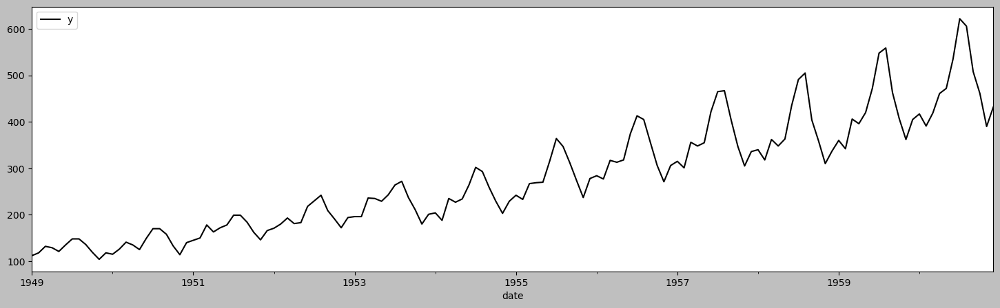

In [48]:
air.plot()

In [49]:
air_results_df = pd.DataFrame(air_results)
air_results_sorted = evaluate_results(air_results_df)
print(air_results_sorted.head(3))

                           Model Name       RMSE      MAPE      MASE
0                    Ridge Regression  39.358884  0.076121  1.390807
1                   Linear Regression  39.820148  0.077452  1.411072
2  Support Vector Regression (linear)  43.608249  0.079431  1.448104


<Axes: xlabel='Month'>

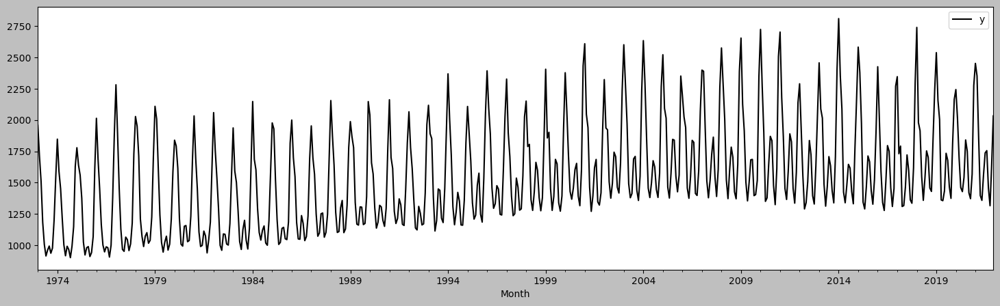

In [50]:
energy.plot()

In [51]:
en_results_df = pd.DataFrame(en_results)
en_results_sorted = evaluate_results(en_results_df)
print(en_results_sorted.head(3))

                        Model Name        RMSE      MAPE      MASE
0            Extra Tree Regression  100.980110  0.040237  0.319099
1    K-Nearest Neighbor Regression  109.006412  0.041790  0.334015
2  Support Vector Regression (RBF)  107.643507  0.045597  0.359839


<Axes: xlabel='DateTime'>

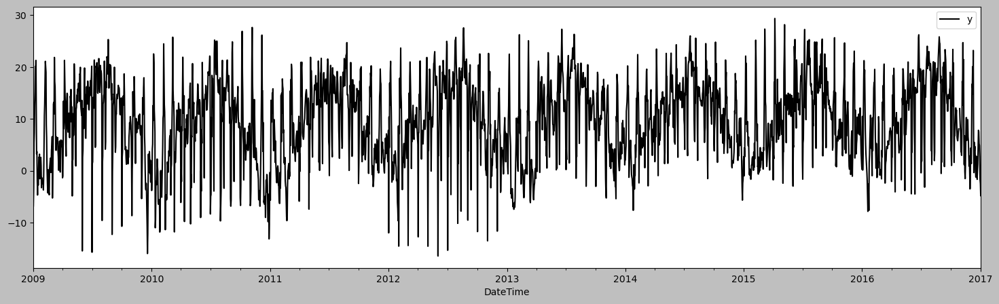

In [52]:
daily_temp.plot()

In [53]:
dw_results_df = pd.DataFrame(dw_results)
dw_results_sorted = evaluate_results(dw_results_df)
print(dw_results_sorted.head(3))

                        Model Name      RMSE      MAPE      MASE
0  Support Vector Regression (RBF)  4.654812  1.908226  0.891606
1            Extra Tree Regression  4.760883  2.006137  0.925396
2         Random Forest Regression  4.772555  1.530875  0.943475


#### Air Passengers Plots

In [54]:
from statsmodels.graphics.tsaplots import plot_acf

def plot_results(results, data_name):
    cols = ['yhat', 'resid', 'actual', 'Model Name']
    for row in results[cols].iterrows():
        yhat, resid, actual, name = row[1]
        plt.title(f'{data_name} - {name}')
        plt.plot(actual, 'k--', alpha=0.5)
        plt.plot(yhat, 'k')
        plt.legend(['actual', 'forecast'])
        plot_acf(resid, zero=False, 
                 title=f'{data_name} - {name} Residual ACF Plot')
        plt.show()


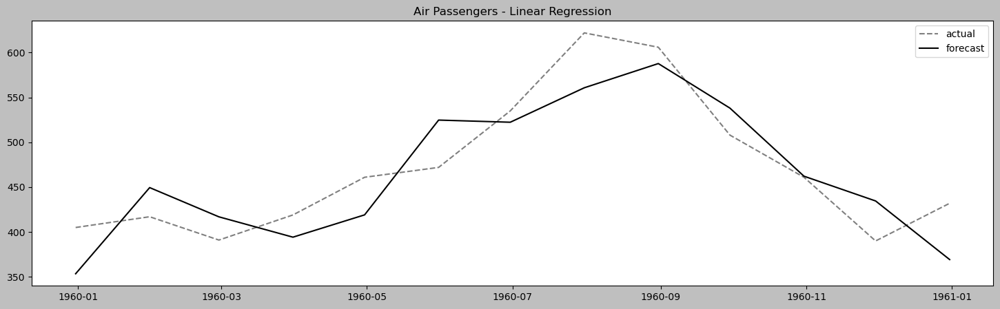

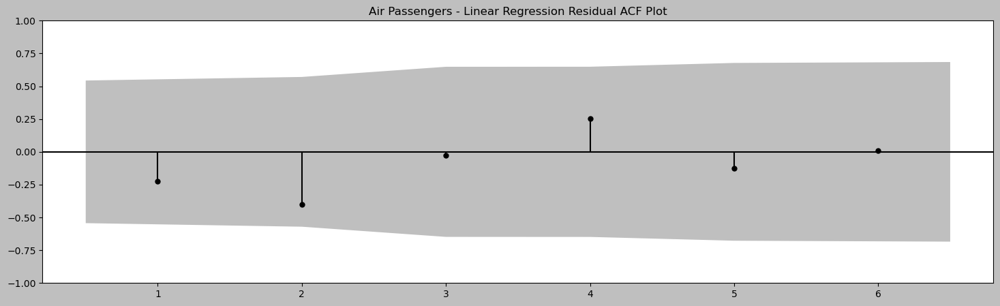

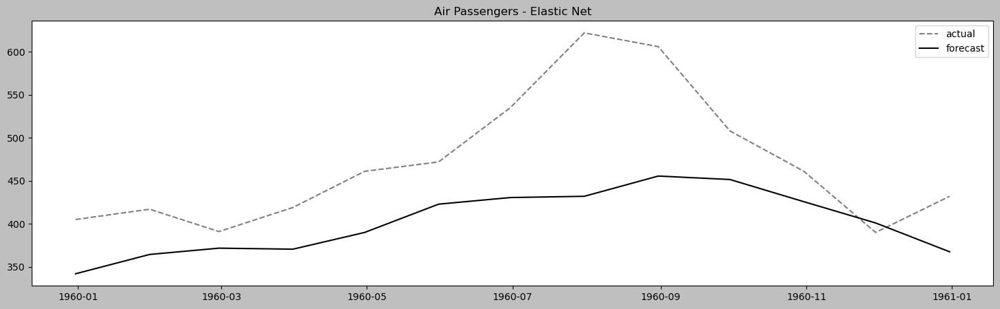

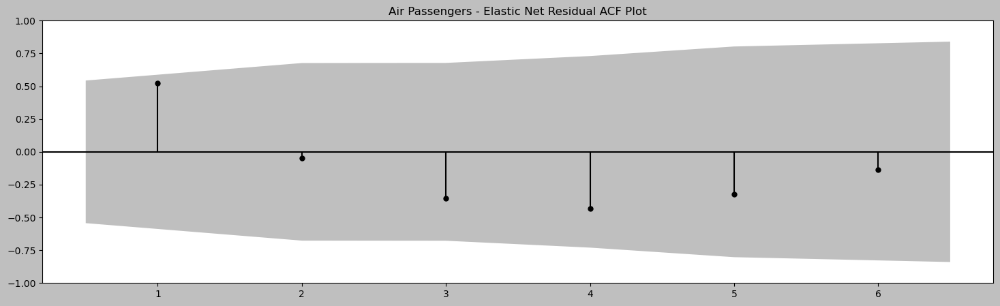

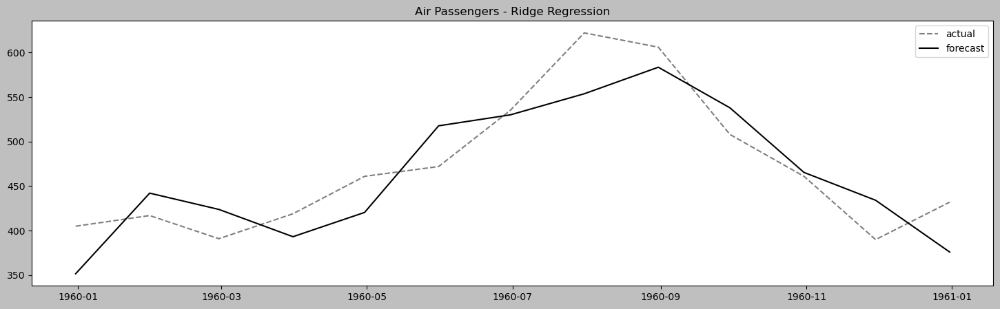

...

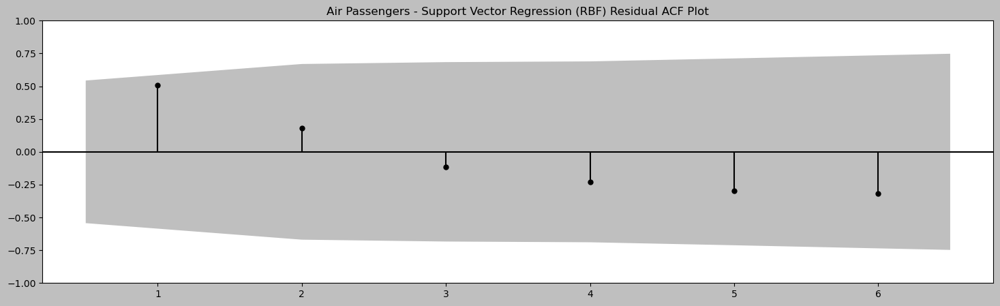

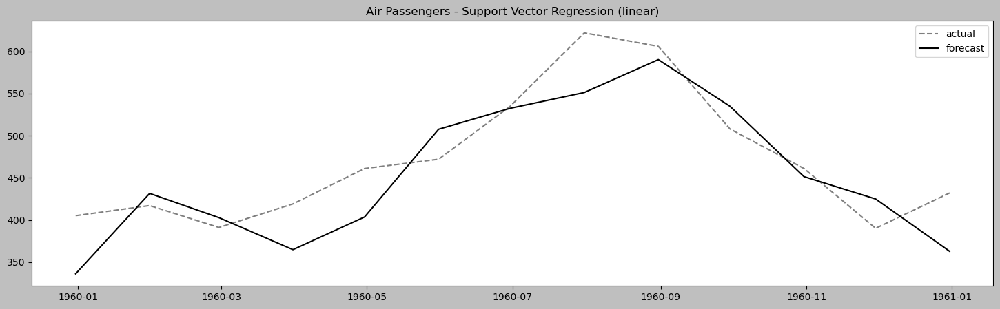

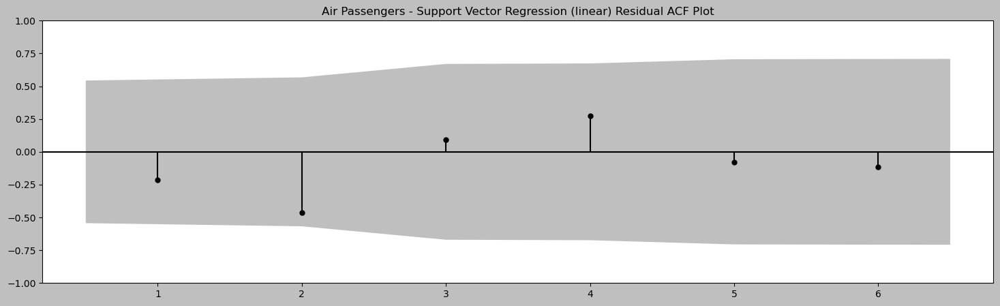

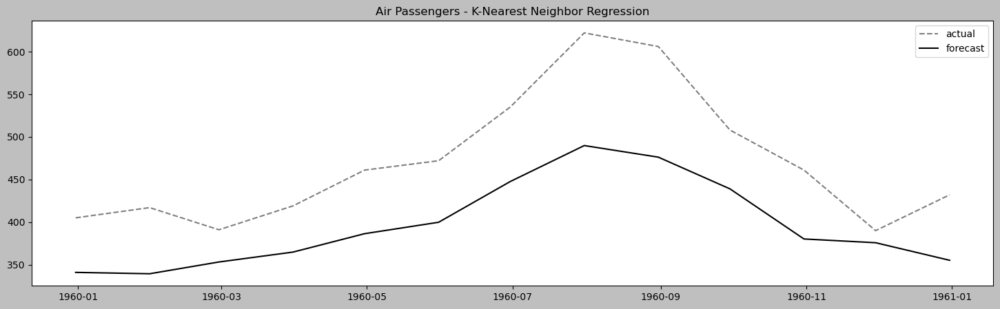

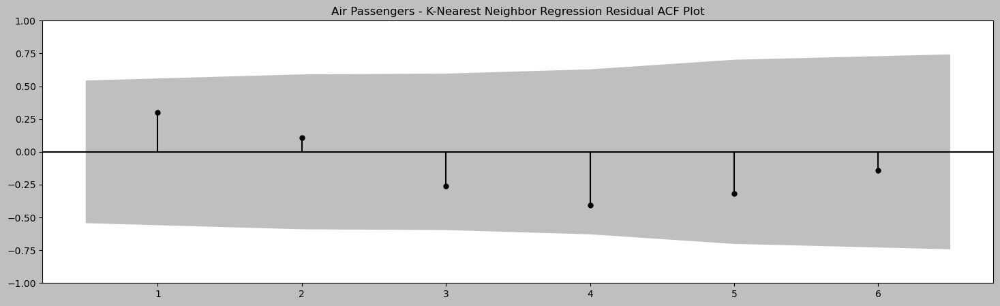

In [55]:
plot_results(air_results_df, 'Air Passengers')

#### Energy Consumption Plots

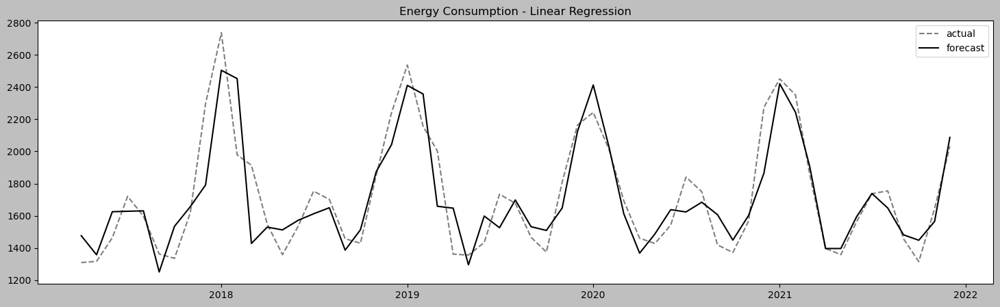

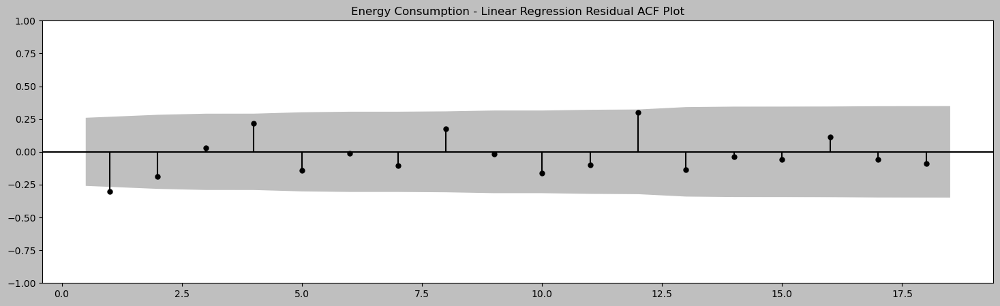

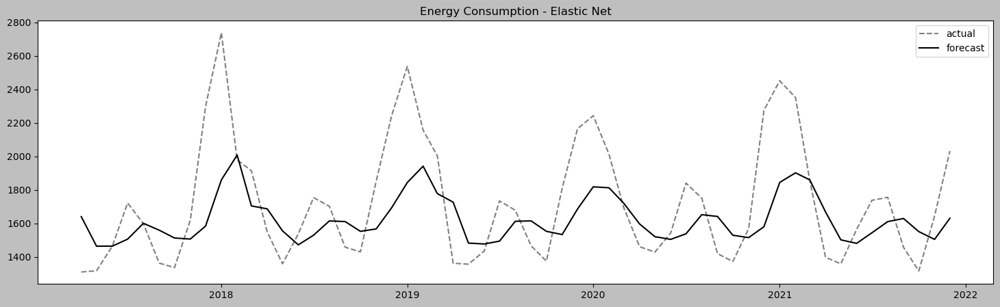

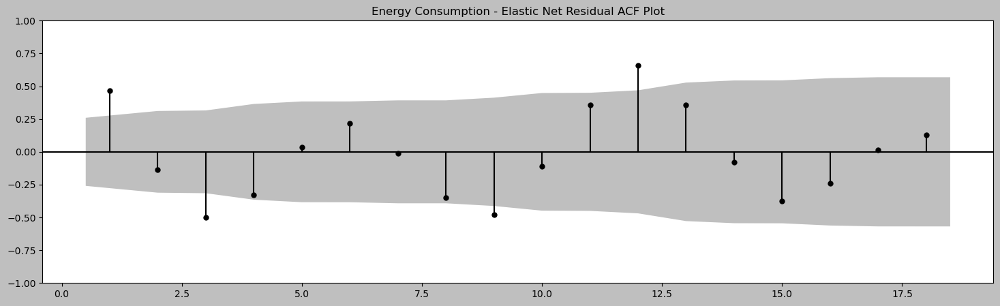

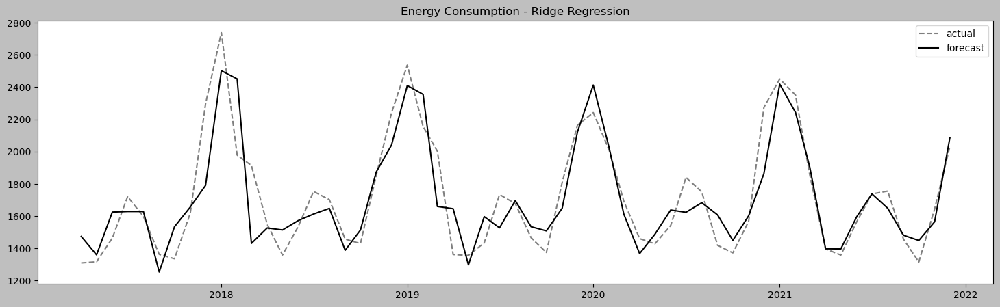

...

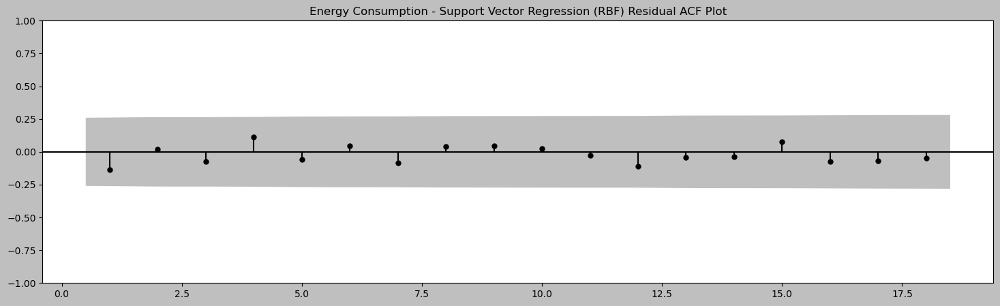

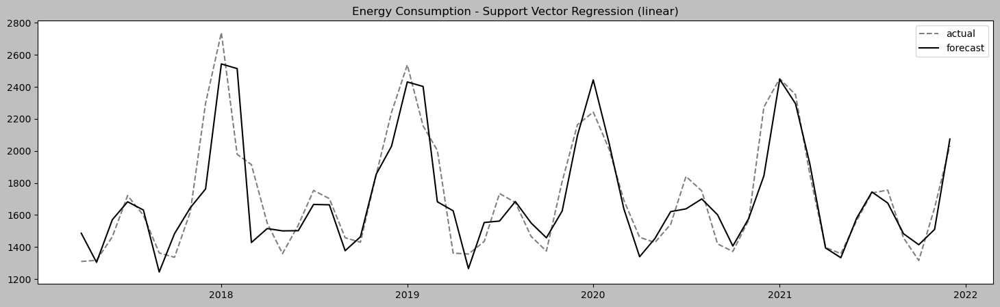

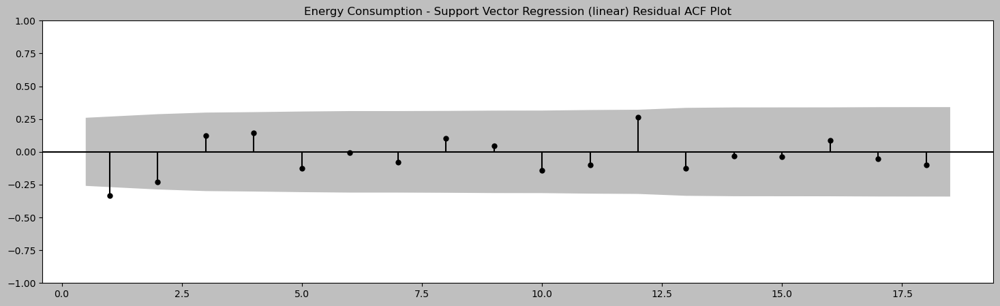

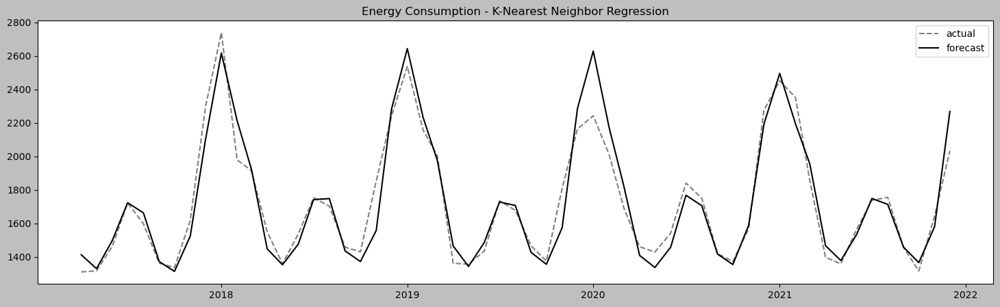

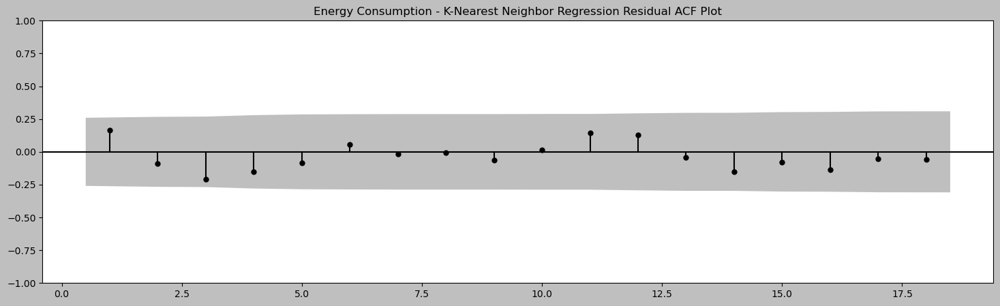

In [56]:
plot_results(en_results_df, 'Energy Consumption')

#### Daily Temperature Plots

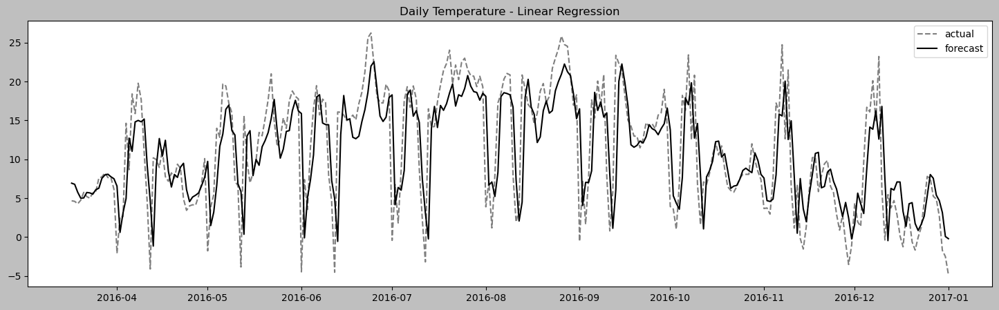

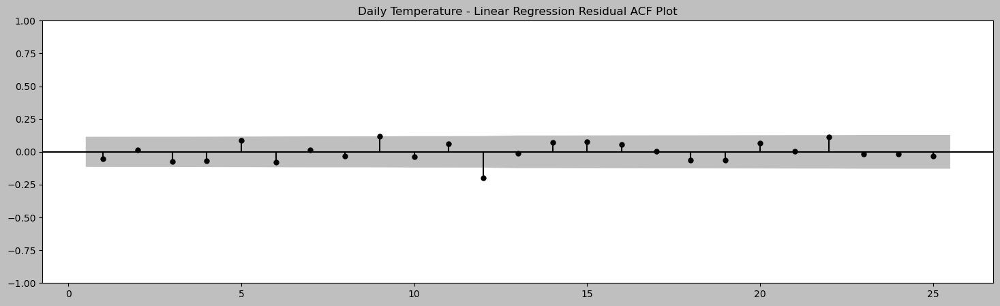

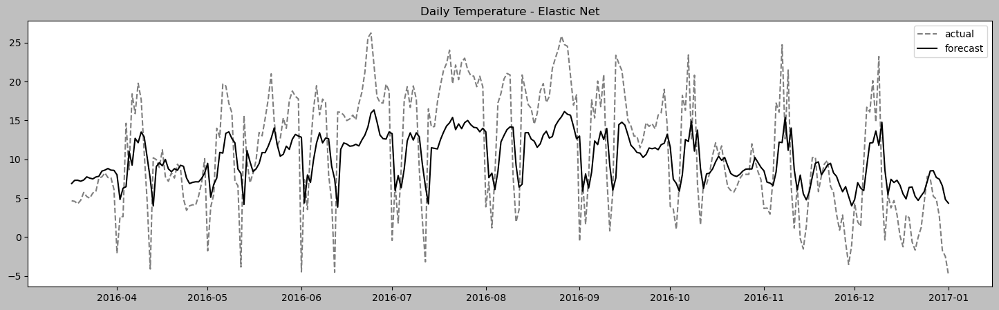

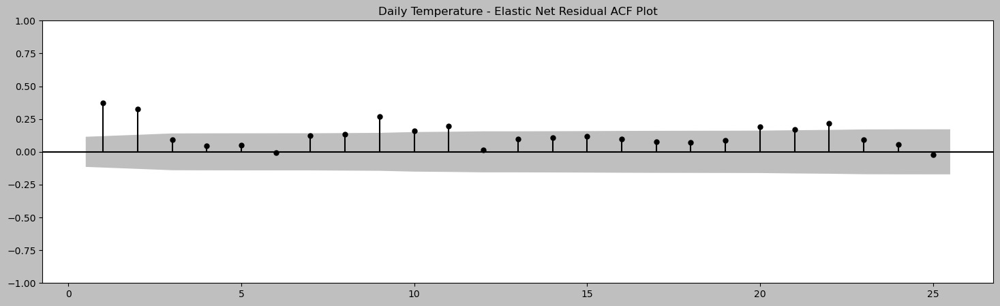

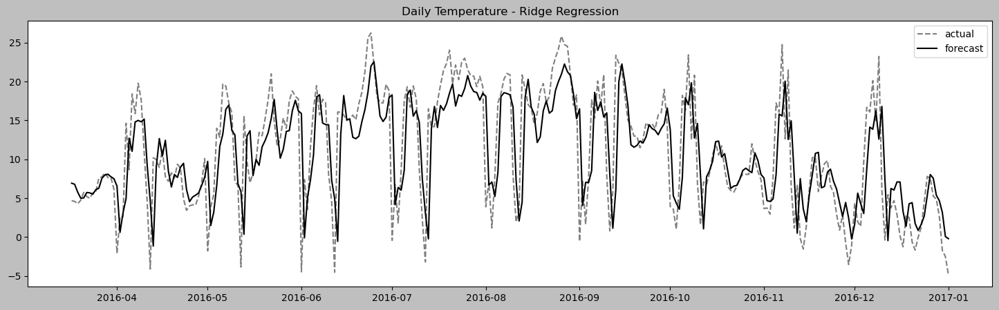

...

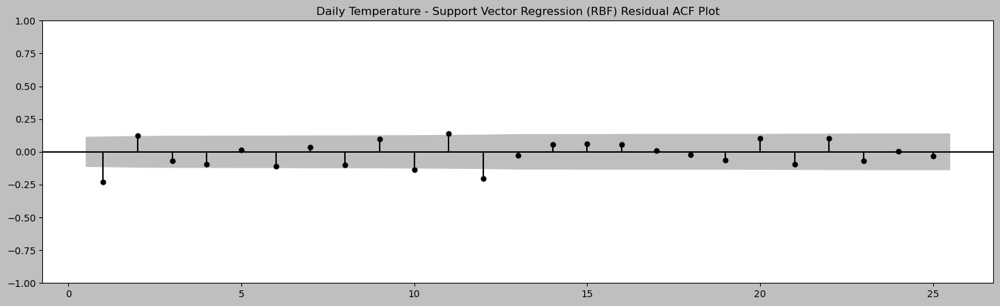

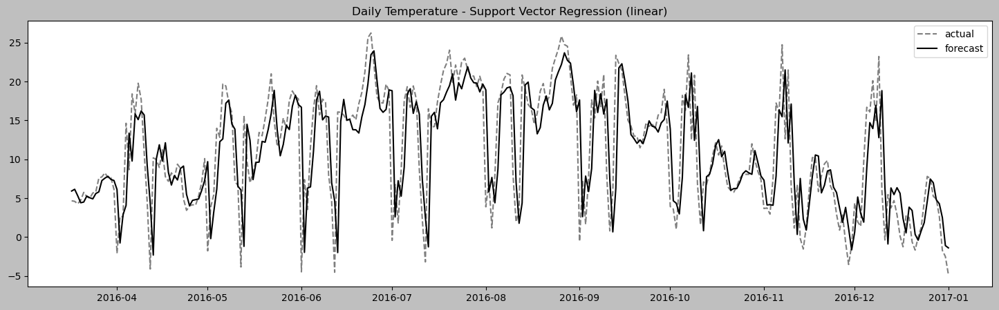

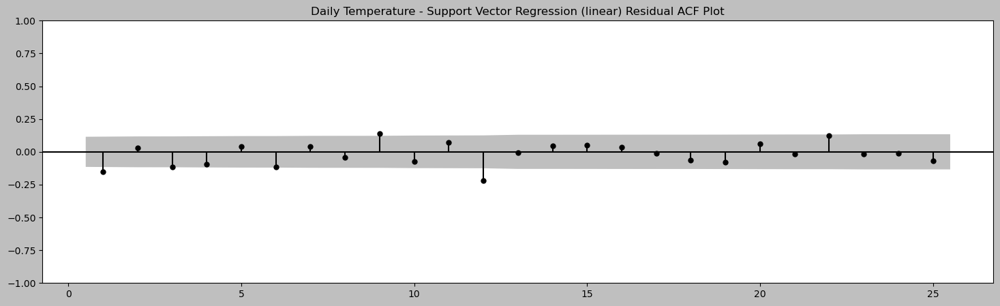

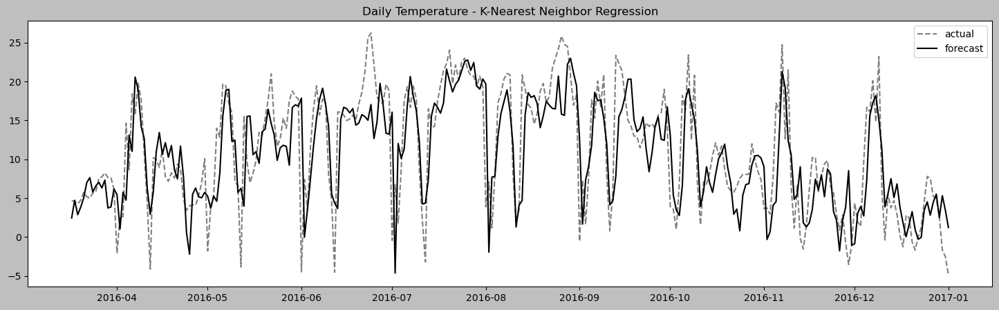

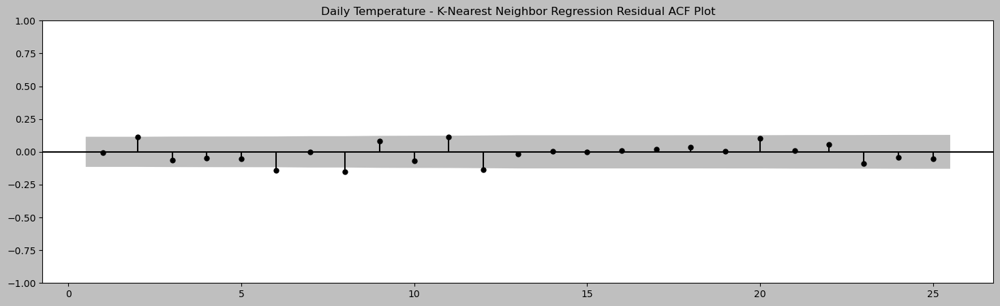

In [57]:
plot_results(dw_results_df, 'Daily Temperature')

## How it works

In [58]:
dw_results_df.head()

,Model Name,Model,RMSE,MAPE,MASE,MAE,yhat,resid,actual
0,Linear Regression,LinearRegression(),5.077762,1.670720,0.990057,3.614832,DateTime 2016-03-17 6.930019 2016-03-18 ...,"[-2.2617550157218265, -2.1886512162522775, -1....",DateTime 2016-03-17 4.668264 2016-03-18 ...
1,Elastic Net,ElasticNet(alpha=0.5),5.794283,3.633642,1.300792,4.749366,DateTime 2016-03-17 6.885837 2016-03-18 ...,"[-2.217573029403094, -2.697755543000012, -3.02...",DateTime 2016-03-17 4.668264 2016-03-18 ...
2,Ridge Regression,Ridge(alpha=0.5),5.077692,1.671321,0.990085,3.614933,DateTime 2016-03-17 6.930442 2016-03-18 ...,"[-2.262177758715474, -2.189406801433865, -1.49...",DateTime 2016-03-17 4.668264 2016-03-18 ...
3,Lasso Regression,Lasso(alpha=0.5),6.396664,4.572397,1.468567,5.361935,DateTime 2016-03-17 7.866928 2016-03-18 ...,"[-3.1986638749848053, -3.49399881168622, -3.79...",DateTime 2016-03-17 4.668264 2016-03-18 ...
4,Huber Regression,HuberRegressor(),5.151917,1.281640,0.969541,3.539925,DateTime 2016-03-17 6.155529 2016-03-18 ...,"[-1.4872648969143611, -1.7076982507110712, -1....",DateTime 2016-03-17 4.668264 2016-03-18 ...


In [59]:
air_results_df.head()

,Model Name,Model,RMSE,MAPE,MASE,MAE,yhat,resid,actual
0,Linear Regression,LinearRegression(),39.820148,0.077452,1.411072,35.394382,date 1959-12-31 353.427406 1960-01-31 44...,"[51.57259411172765, -32.487054214633304, -25.8...",date 1959-12-31 405.0 1960-01-31 417.0 1...
1,Elastic Net,ElasticNet(alpha=0.5),85.620713,0.139963,2.808737,70.452495,date 1959-12-31 341.943738 1960-01-31 36...,"[63.05626161099167, 52.6151691830857, 19.30366...",date 1959-12-31 405.0 1960-01-31 417.0 1...
2,Ridge Regression,Ridge(alpha=0.5),39.358884,0.076121,1.390807,34.886068,date 1959-12-31 351.672968 1960-01-31 44...,"[53.32703229694653, -25.134325887626346, -32.8...",date 1959-12-31 405.0 1960-01-31 417.0 1...
3,Lasso Regression,Lasso(alpha=0.5),122.902761,0.227574,4.439302,111.352498,date 1959-12-31 313.304478 1960-01-31 33...,"[91.69552161325373, 84.29648492551638, 53.1241...",date 1959-12-31 405.0 1960-01-31 417.0 1...
4,Huber Regression,HuberRegressor(),44.031067,0.081506,1.473024,36.948363,date 1959-12-31 338.718828 1960-01-31 43...,"[66.28117237620523, -20.153832498180293, -10.8...",date 1959-12-31 405.0 1960-01-31 417.0 1...


In [60]:
air.head(15)

,y
date,
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
1949-06-30,135
1949-07-31,148
1949-08-31,148
1949-09-30,136


In [61]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


## There is more

In [62]:
air_models = air_results_df.iloc[0:4]

for row in air_models.iterrows():
    print(row[1]['Model Name'])
    print(row[1]['Model'].coef_)

Linear Regression
[ 0.26681178  0.23043566 -0.42770452  0.24811951 -0.19850306  0.36627057
 -0.34839752  0.17465605 -0.4063289   1.0808261 ]
Elastic Net
[0.18648073 0.0263418  0.         0.         0.         0.
 0.         0.         0.10713549 0.34068171]
Ridge Regression
[ 0.33843604  0.11322012 -0.30232719  0.12859953 -0.06811208  0.2329643
 -0.22611879  0.03192433 -0.22325426  0.95924758]
Lasso Regression
[0.00797701 0.         0.         0.         0.         0.
 0.         0.         0.         0.44080144]


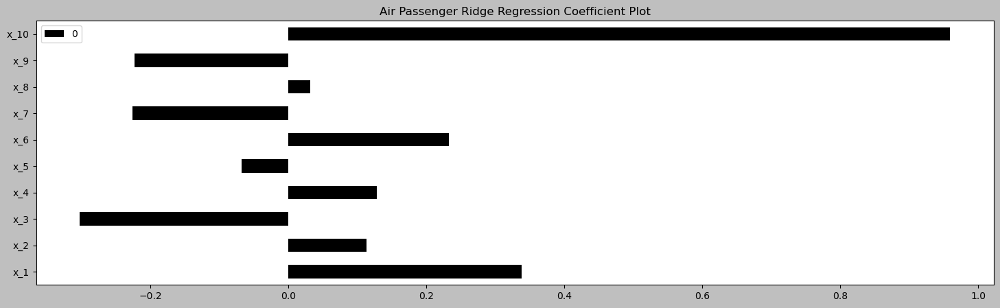

In [63]:
y_test = test_en['y']
X_test = test_en.drop(columns=['y'])

air_ridge = air_results_df.iloc[2]['Model'].coef_
title='Air Passenger Ridge Regression Coefficient Plot'
pd.DataFrame(air_ridge, X_test.columns).plot(kind='barh', 
                                             title=title);

In [64]:
en_results_df.iloc[7]

Model Name                                Extra Tree Regression
Model         (ExtraTreeRegressor(random_state=375461353), E...
RMSE                                                  100.98011
MAPE                                                   0.040237
MASE                                                   0.319099
MAE                                                   72.763369
yhat          Month
2017-04-01    1436.33222
2017-05-01    1...
resid         [-126.58822000000009, -25.27240000000006, -38....
actual        Month
2017-04-01    1309.744
2017-05-01    131...
Name: 7, dtype: object

In [65]:
en_results_df.iloc[7]['Model'].feature_importances_

array([0.11895052, 0.0291979 , 0.05605915, 0.04295914, 0.0391605 ,
       0.03347394, 0.03911761, 0.06860116, 0.059058  , 0.51342209])

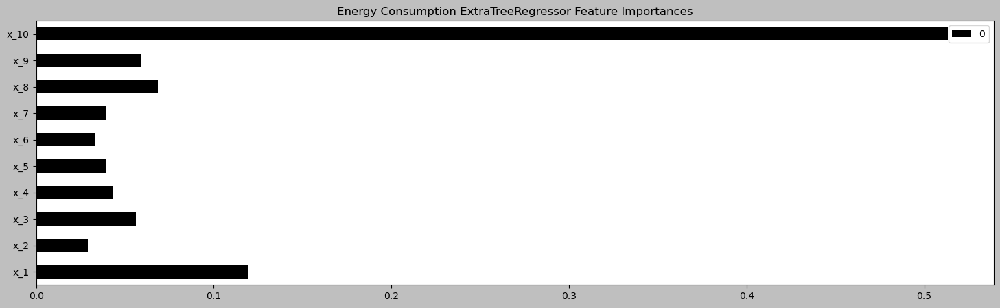

In [66]:
en_features = en_results_df.iloc[7]['Model'].feature_importances_
title = 'Energy Consumption ExtraTreeRegressor Feature Importances'
pd.DataFrame(en_features, X_test.columns).plot(kind='barh',
                                              title=title);

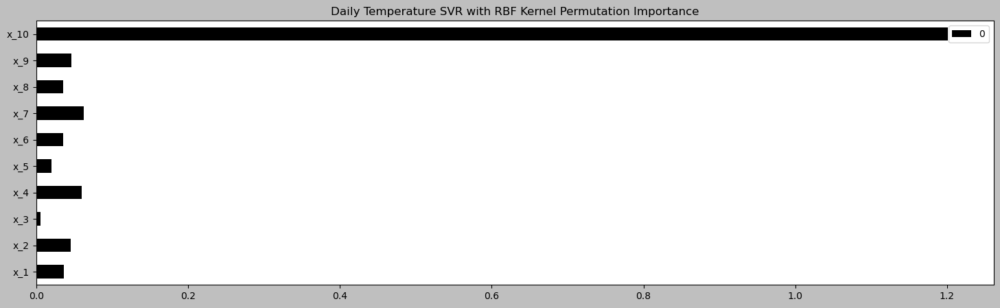

In [67]:
from sklearn.inspection import permutation_importance
svr_rbf = dw_results_df.iloc[8]['Model']

y_test = test_dw['y']
X_test = test_dw.drop(columns=['y'])

result = permutation_importance(svr_rbf, X_test, y_test, n_repeats=10, random_state=42)
perm_importance = result.importances_mean
title='Daily Temperature SVR with RBF Kernel Permutation Importance'
pd.DataFrame(perm_importance, X_test.columns).plot(kind='barh',
                                                  title=title);

# Recipe 3. Multi-Step Forecasting using Linear Regression Models with Scikit-Learn

In [68]:
air_results = train_different_models(train_air, test_air, regressors, scale_air)
en_results = train_different_models(train_en, test_en, regressors, scale_en)
dw_results = train_different_models(train_dw, test_dw, regressors, scale_dw)

air_results = pd.DataFrame(air_results)
en_results = pd.DataFrame(en_results)
dw_results = pd.DataFrame(dw_results)

training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...
training Linear Regression ...
training Elastic Net ...
training Ridge Regression ...
training Lasso Regression ...
training Huber Regression ...
training Random Forest Regression ...
training Gradient Boos

In [69]:
models = air_results[['Model Name','Model']]
models

,Model Name,Model
0,Linear Regression,LinearRegression()
1,Elastic Net,ElasticNet(alpha=0.5)
2,Ridge Regression,Ridge(alpha=0.5)
3,Lasso Regression,Lasso(alpha=0.5)
4,Huber Regression,HuberRegressor()
5,Random Forest Regression,"(DecisionTreeRegressor(max_features=1.0, rando..."
6,Gradient Boosting Regression,([DecisionTreeRegressor(criterion='friedman_ms...
7,Extra Tree Regression,"(ExtraTreeRegressor(random_state=1734480729), ..."
8,Support Vector Regression (RBF),SVR()
9,Support Vector Regression (linear),SVR(kernel='linear')


In [70]:
#another version using NumPy
def recursive_forecast(data, model, steps=10):
    forecast = []
    data = np.array(data, copy=True)  
    
    for i in range(steps):
        one_step_pred = model.predict(data.reshape(1, -1))[0]
        forecast.append(one_step_pred)
        
        data = np.roll(data, shift=-1)
        data[-1] = one_step_pred
    
    return np.array(forecast)

In [71]:
def recursive_forecast(data, model, steps=10):
    forecast = []
    data = data.copy()
    
    for i in range(steps):
        one_step_pred = model.predict(np.array(data).reshape(1,-1))[0]
        forecast.append(one_step_pred)
        
        _ = data.pop(0)
        data.append(one_step_pred)
        
    return np.array(forecast)

### Daily Temperature

In [72]:
# display(test_dw)
# test_dw.drop(columns=['y']).iloc[-1].tolist()

In [73]:
import warnings
warnings.filterwarnings(action='ignore', category=UserWarning)

frcst_dw = {}
models = dw_results[['Model Name','Model']]
dw_ms = test_dw.drop(columns=['y']).iloc[-1].tolist()

for i in models.iterrows():
    pred = recursive_forecast(dw_ms, steps=10, model=i[1]['Model'])
    # pred = scale_dw.inverse_y(pred)
    frcst_dw[i[1]['Model Name']] = pred    

### Air Passengers

In [74]:
models = air_results[['Model Name','Model']]
air_ms = test_air.drop(columns=['y']).iloc[-1].tolist()
frcst_air = {}
for i in models.iterrows():
    pred = recursive_forecast(air_ms, steps=10, model=i[1]['Model'])
    pred = scale_air.inverse_y(pred)
    frcst_air[i[1]['Model Name']] = pred   

### Energy Consumption

In [75]:
models = en_results[['Model Name','Model']]
en_ms = test_en.drop(columns=['y']).iloc[-1].tolist()
frcst_en = {}
for i in models.iterrows():
    pred = recursive_forecast(en_ms, steps=10, model=i[1]['Model'])
    pred = scale_en.inverse_y(pred)
    frcst_en[i[1]['Model Name']] = pred   

#### Example plotting Air Passenger Data

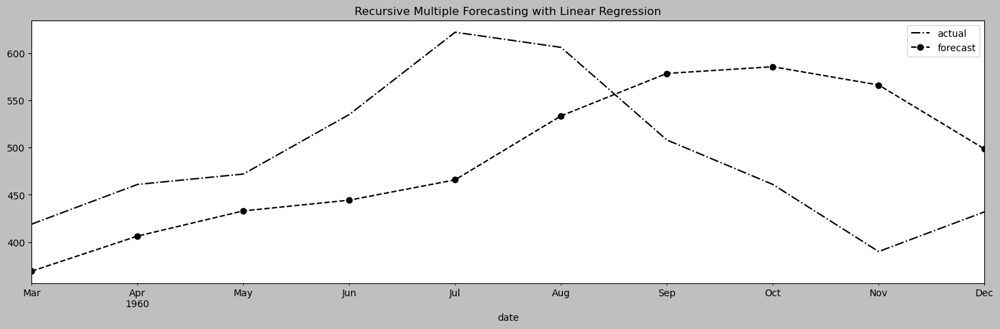

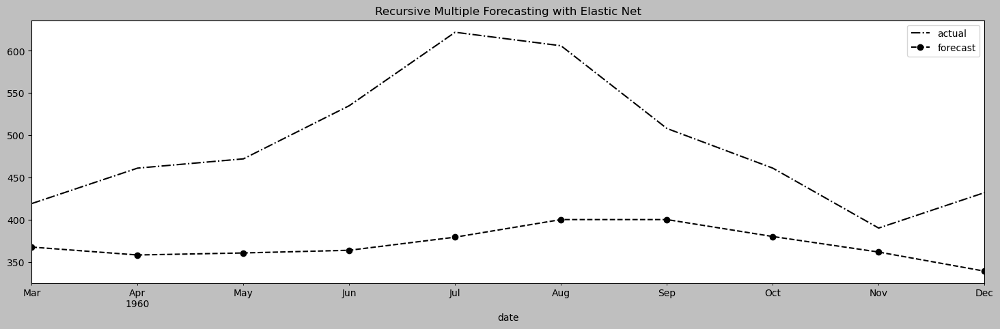

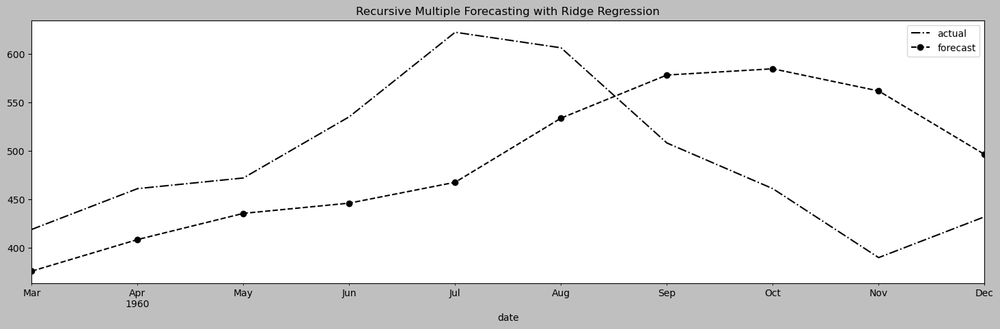

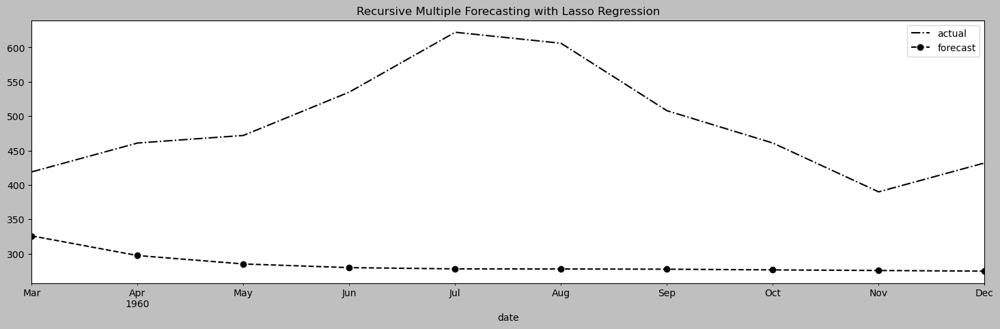

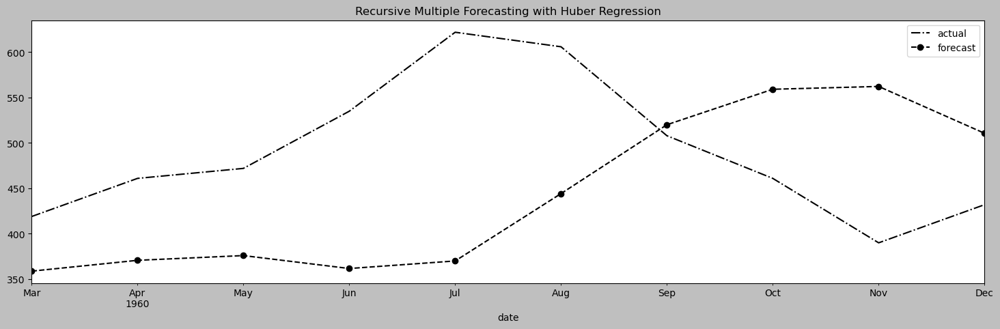

...

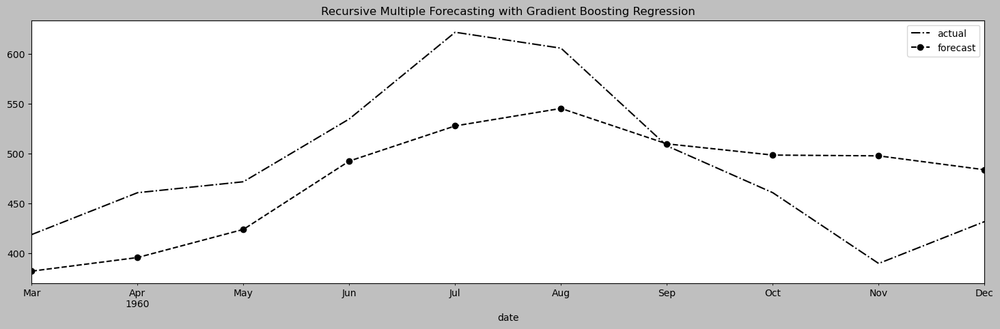

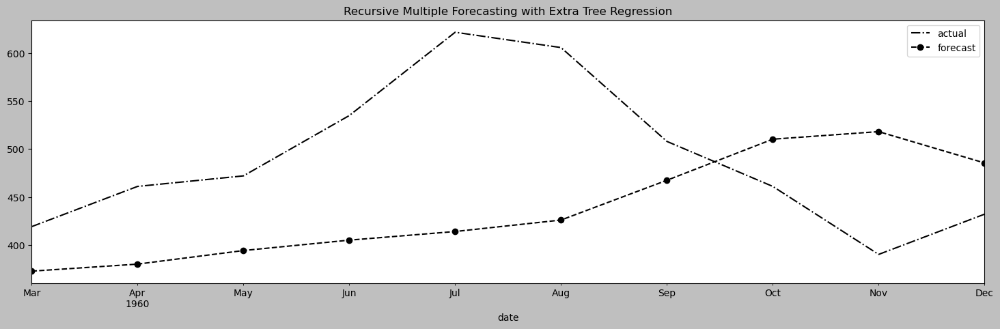

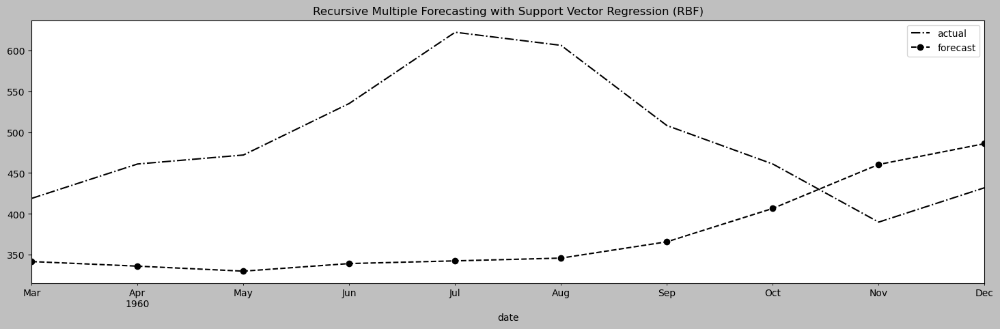

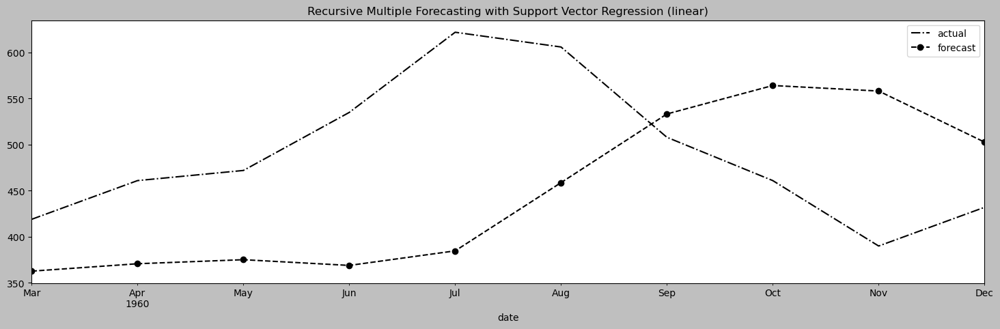

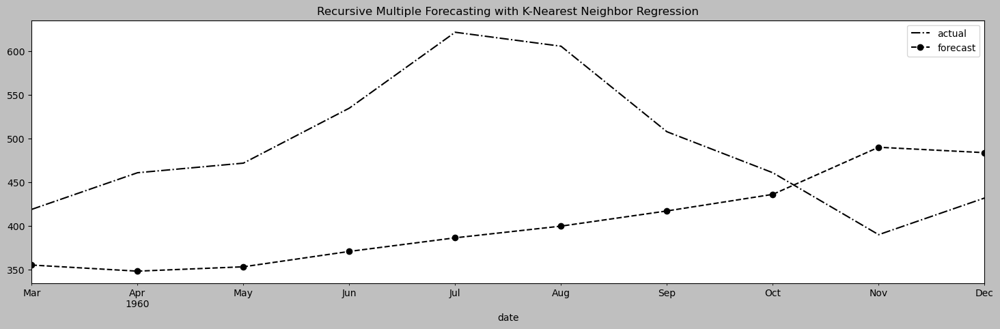

In [76]:
for name, pred in frcst_air.items():
    actual = air_cp.iloc[-10:]
    ax = actual.plot(style='k-.')
    pd.Series(pred, index=air_cp.index[-10:]).plot(style='k--o', ax=ax)
    plt.title(f'Recursive Multiple Forecasting with {name}')
    plt.legend(['actual', 'forecast'])
    plt.show()

#### Example of longer forecast and issues with Recursive strategy

In [77]:
frcst_air = {}
models = air_results[['Model Name','Model']]
air_ms = test_air.drop(columns=['y']).iloc[-1].tolist()

for i in models.iterrows():
    pred = recursive_forecast(air_ms, steps=20, model=i[1]['Model'])
    pred = scale_air.inverse_y(pred)
    frcst_air[i[1]['Model Name']] = pred   

In [78]:
air_cp

,y
date,
1949-01-31,112
1949-02-28,118
1949-03-31,132
1949-04-30,129
1949-05-31,121
...,...
1960-08-31,606
1960-09-30,508
1960-10-31,461


In [79]:
last_date = air_cp.index[-1]

# Generate a date range for the next 10 months, with a monthly frequency ('M')
new_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=10, freq='ME')

# Concatenate the original index with the new dates
extended_index = air_cp.index.append(new_dates)
extended_index[-20:]

DatetimeIndex(['1960-03-31', '1960-04-30', '1960-05-31', '1960-06-30',
               '1960-07-31', '1960-08-31', '1960-09-30', '1960-10-31',
               '1960-11-30', '1960-12-31', '1961-01-31', '1961-02-28',
               '1961-03-31', '1961-04-30', '1961-05-31', '1961-06-30',
               '1961-07-31', '1961-08-31', '1961-09-30', '1961-10-31'],
              dtype='datetime64[ns]', freq='ME')

In [80]:
print(len(pred))
actual.shape

20


(10, 1)

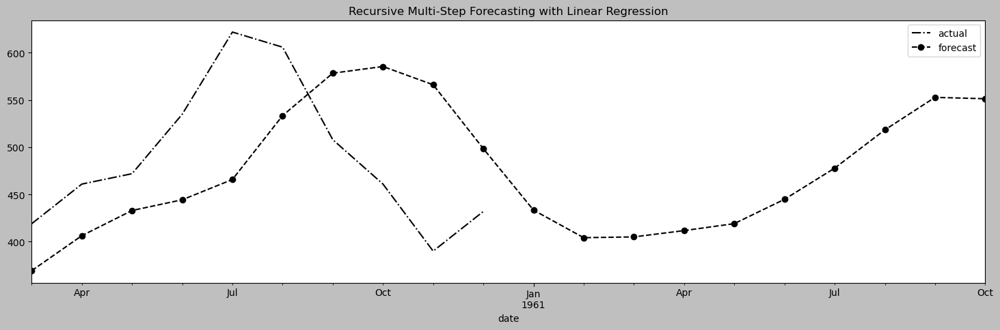

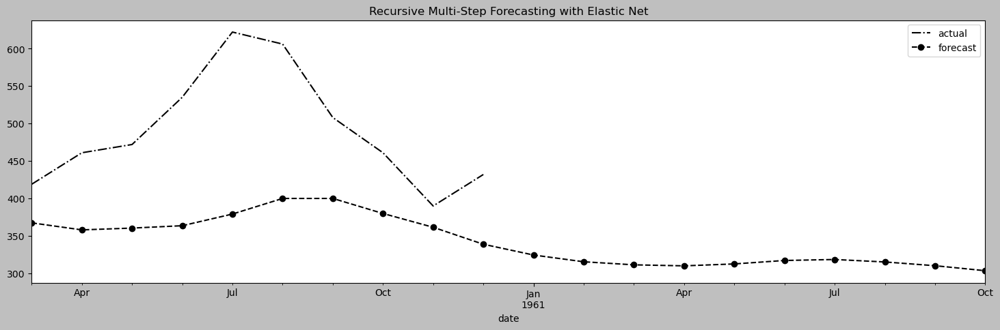

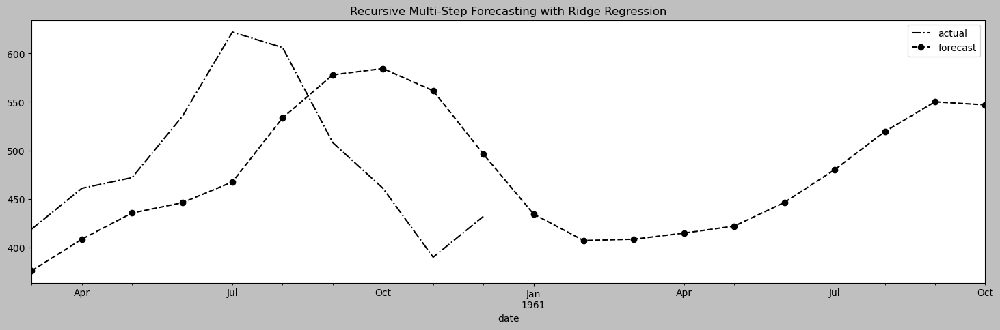

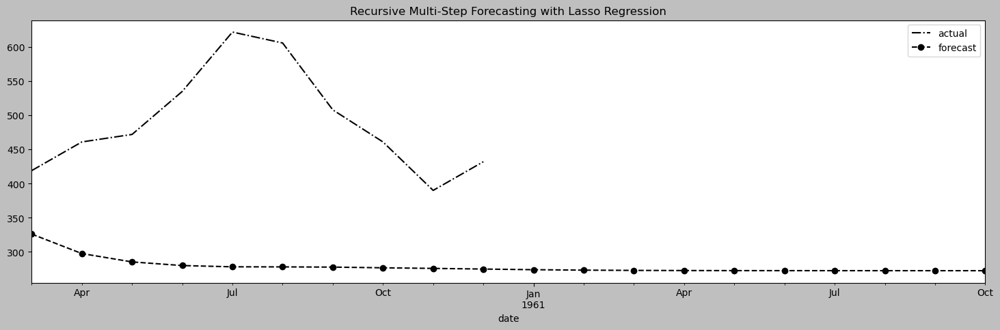

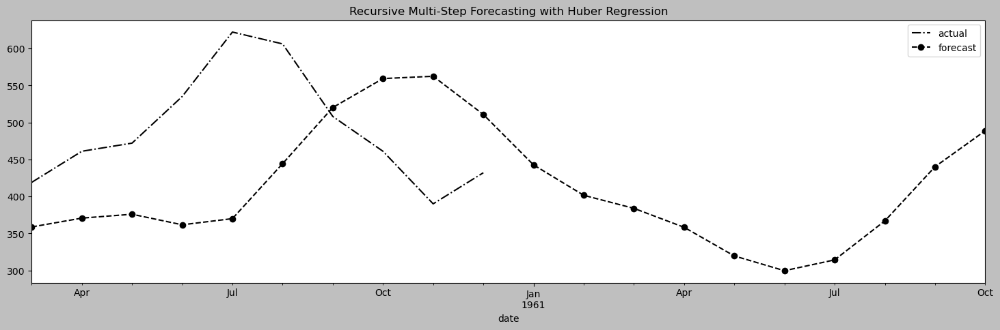

...

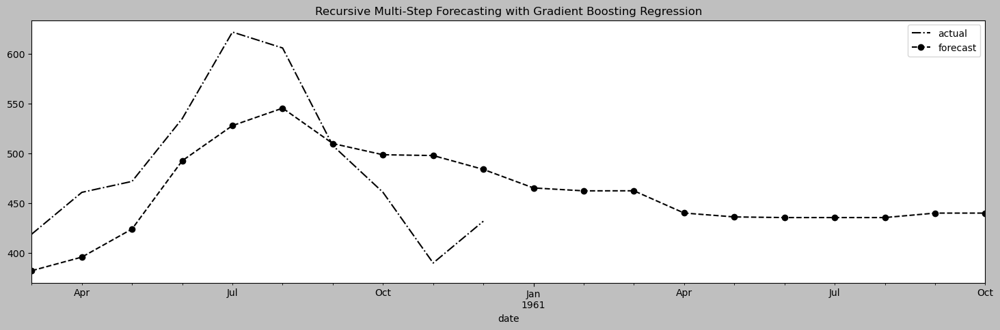

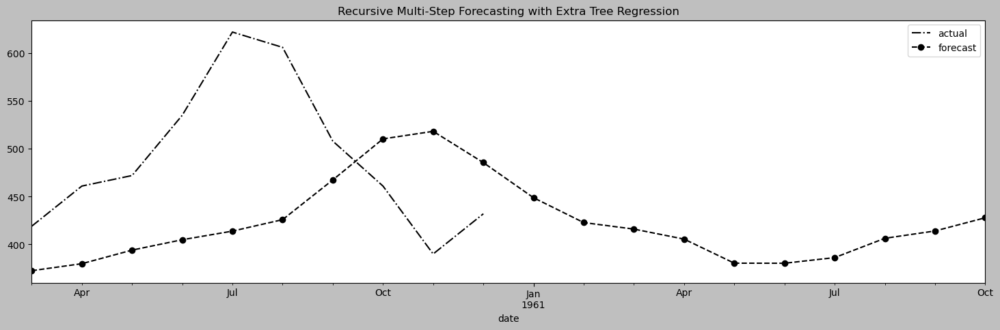

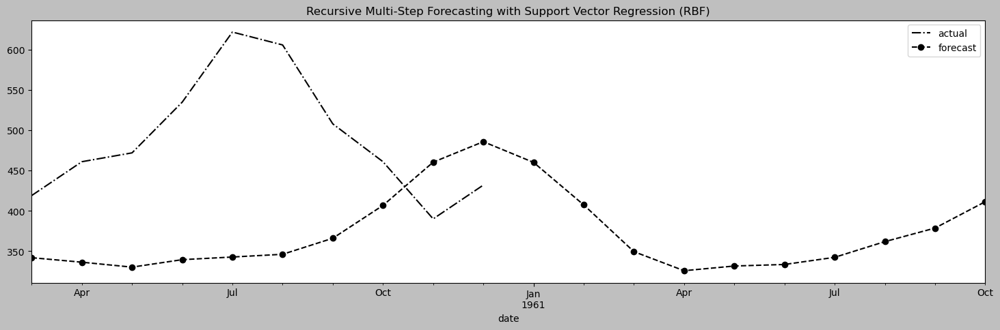

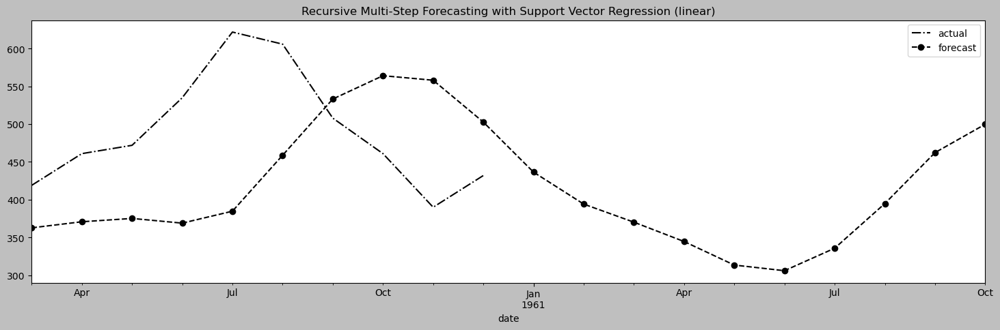

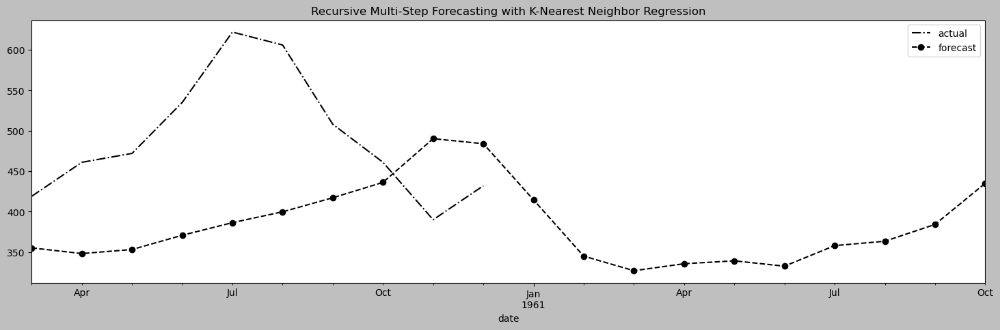

In [81]:
for name, pred in frcst_air.items():
    actual = air_cp.iloc[-10:]
    ax = actual.plot(style='k-.')
    pd.Series(pred, index=extended_index[-20:]).plot(style='k--o', ax=ax)
    plt.title(f'Recursive Multi-Step Forecasting with {name}')
    plt.legend(['actual', 'forecast'])
    plt.show()

## There is more

In [82]:
import numpy as np
import pandas as pd

def multiple_output_features(df, window_in, window_out):
    d = df.values.squeeze()

    x = np.lib.stride_tricks.sliding_window_view(d, window_shape=window_in)[:-window_out]
    y = np.lib.stride_tricks.sliding_window_view(d[window_in:], window_shape=window_out)

    cols_x = [f'x_{i}' for i in range(1, window_in + 1)]
    cols_y = [f'y_{i}' for i in range(1, window_out + 1)]
    
    df_xs = pd.DataFrame(x, columns=cols_x, index=df.index[window_in:len(df) - window_out + 1])
    df_ys = pd.DataFrame(y, columns=cols_y, index=df.index[window_in:len(df) - window_out + 1])

    return pd.concat([df_xs, df_ys], axis=1)



In [83]:
# def multiple_output_features(df, window_in, window_out):
#     d = df.values
#     x = []
#     y = []
#     n = len(df)
#     idx = df.index[:-window_in]
#     print(len(idx))
#     for start in range(n-window_in):
#         end = start + window_in
#         out = end + window_out
#         x.append(d[start:end].ravel())
#         y.append(d[end:out].ravel())
        
#     cols_x = [f'x_{i}' for i in range(1, window_in+1)]
#     cols_y = [f'y_{i}' for i in range(1, window_out+1)]

#     df_xs = pd.DataFrame(x,  index=idx, columns=cols_x)
#     df_y = pd.DataFrame(y,index=idx, columns=cols_y)
#     return pd.concat([df_xs, df_y], axis=1).dropna()

In [84]:
air_ml.head()

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,y
date,,,,,,,,,,,
1949-11-30,112,118,132,129,121,135,148,148,136,119,104
1949-12-31,118,132,129,121,135,148,148,136,119,104,118
1950-01-31,132,129,121,135,148,148,136,119,104,118,115
1950-02-28,129,121,135,148,148,136,119,104,118,115,126
1950-03-31,121,135,148,148,136,119,104,118,115,126,141


In [85]:
win_in, win_out = 10, 10
air_mo = multiple_output_features(air_cp, win_in, win_out)
dw_mo = multiple_output_features(dw_cp, win_in, win_out)
en_mo = multiple_output_features(en_cp, win_in, win_out)

# train_air, test_air = split_data(air_mo, test_split=0.10)
# scaler_air = Standardize()
# train_air_sc, test_air_sc = scaler_air.fit_transform(train_air,test_air)

In [86]:
print(air_mo.columns)

Index(['x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'x_6', 'x_7', 'x_8', 'x_9', 'x_10',
       'y_1', 'y_2', 'y_3', 'y_4', 'y_5', 'y_6', 'y_7', 'y_8', 'y_9', 'y_10'],
      dtype='object')


In [87]:
train_mo_air, test_mo_air = split_data(air_mo, test_split=0.10)
train_mo_en, test_mo_en = split_data(en_mo, test_split=0.10)
train_mo_dw, test_mo_dw = split_data(dw_mo, test_split=0.10)

In [88]:
from sklearn.metrics import mean_squared_error as mse, mean_absolute_error as mae
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler

def train_model_mo(train, test, regressor, reg_name, win_in, win_out):
    X_train, y_train = train.iloc[:, :win_in], train.iloc[:, win_in:]
    X_test, y_test = test.iloc[:, :win_in], test.iloc[:, win_in:]

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()
    
    X_train_s = scaler_X.fit_transform(X_train)  
    y_train_s = scaler_y.fit_transform(y_train)  

    X_test_s = scaler_X.transform(X_test)
    y_test_s = scaler_y.transform(y_test)
    
    try:
        reg = regressor().fit(X_train_s, y_train_s) 
        print(f'Training {reg_name} ...')
    except:
        print(f'{reg_name} does not support multiple outputs')
        try:
            reg = MultiOutputRegressor(regressor()).fit(X_train_s, y_train_s)
            print(f'using sklearn MultipleOutput for {reg_name}')
        except Exception as e:
            print(f'Failed for {reg_name}: {e}')
        
    yhat = reg.predict(X_test_s)
    yhat = scaler_y.inverse_transform(yhat)
    actual = y_test.values

    # Compute evaluation metrics for multi-output, with multioutput='uniform_average'
    rmse_test = np.sqrt(mse(actual, yhat, multioutput='uniform_average'))
    mae_test = mae(actual, yhat, multioutput='uniform_average')
    mape_test = np.mean(np.abs((actual - yhat) / actual)) * 100 
    mase_test = mase(actual, yhat, y_train=y_train) 

    residuals = actual - yhat
    
    model_metadata = {
        'Model Name': reg_name, 
        'Model': reg, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'test': X_test,
        'yhat': pd.DataFrame(yhat, index=y_test.index, columns=y_test.columns), 
        'resid': pd.DataFrame(residuals, index=y_test.index, columns=y_test.columns),
        'actual': y_test
    }
    
    return model_metadata

def train_different_models(train, test, regressors, win_in, win_out):
    results = []
    for reg_name, regressor in regressors.items():
        result = train_model_mo(
            train=train, 
            test=test, 
            regressor=regressor, 
            reg_name=reg_name, 
            win_in=win_in, 
            win_out=win_out
        )
        results.append(result)
    return results


In [89]:
len(regressors)

11

In [90]:
air_results_mo = train_different_models(train_mo_air, test_mo_air, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [91]:
en_results_mo = train_different_models(train_mo_en, test_mo_en, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [92]:
dw_results_mo = train_different_models(train_mo_dw, test_mo_dw, regressors, win_in=10, win_out=10)

Training Linear Regression ...
Training Elastic Net ...
Training Ridge Regression ...
Training Lasso Regression ...
Huber Regression does not support multiple outputs
using sklearn MultipleOutput for Huber Regression
Training Random Forest Regression ...
Gradient Boosting Regression does not support multiple outputs
using sklearn MultipleOutput for Gradient Boosting Regression
Training Extra Tree Regression ...
Support Vector Regression (RBF) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (RBF)
Support Vector Regression (linear) does not support multiple outputs
using sklearn MultipleOutput for Support Vector Regression (linear)
Training K-Nearest Neighbor Regression ...


In [93]:
air_results_mo[0].keys()

dict_keys(['Model Name', 'Model', 'RMSE', 'MAPE', 'MASE', 'MAE', 'test', 'yhat', 'resid', 'actual'])

In [94]:
air_results_mo_df = pd.DataFrame(air_results_mo)
air_results_mo_sorted = evaluate_results(air_results_mo_df)
print(air_results_mo_sorted.head(3))

                           Model Name       RMSE      MAPE      MASE
0                    Huber Regression  25.349827  4.590653  0.816905
1  Support Vector Regression (linear)  25.908003  4.592281  0.821234
2                    Ridge Regression  26.316594  4.927290  0.884846


In [95]:
en_results_mo_df = pd.DataFrame(en_results_mo)
en_results_mo_sorted = evaluate_results(en_results_mo_df)
print(en_results_mo_sorted.head(3))

                      Model Name        RMSE      MAPE      MASE
0          Extra Tree Regression  116.229628  4.687316  0.371360
1  K-Nearest Neighbor Regression  126.100481  4.808844  0.387433
2       Random Forest Regression  121.423490  5.064059  0.396233


In [96]:
dw_results_mo_df = pd.DataFrame(dw_results_mo)
dw_results_mo_sorted = evaluate_results(dw_results_mo_df)
print(dw_results_mo_sorted.head(3))

                        Model Name      RMSE        MAPE      MASE
0  Support Vector Regression (RBF)  6.070763  370.317016  1.310029
1            Extra Tree Regression  6.137156  354.833968  1.340477
2         Random Forest Regression  6.146906  378.027434  1.343204


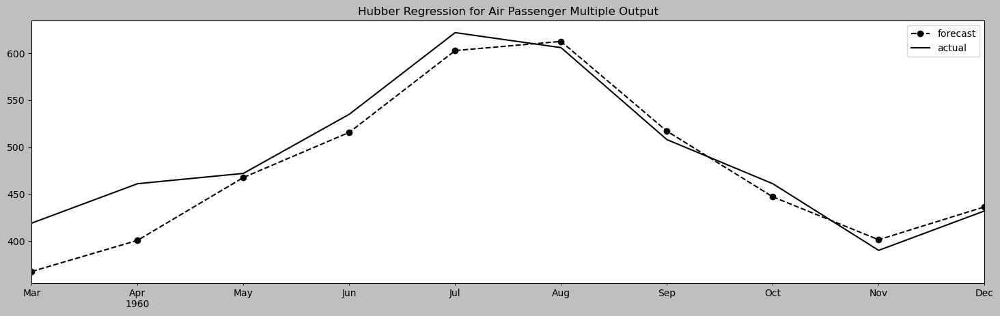

In [97]:
acutal = air_results_mo_df.loc[4]['test'].tail(1).T
forecast = air_results_mo_df.loc[4]['yhat'].tail(1).T
dates = pd.date_range(start='1960-03-31', periods=10, freq='ME')
actual.index = dates
forecast.index = dates
ax = forecast.plot(style='k--o')
actual.plot( ax=ax)
plt.title('Hubber Regression for Air Passenger Multiple Output')
plt.legend(['forecast', 'actual'])
plt.show()

# Recipe 4. Forecasting with sktime

Loading required modules

In [254]:
# !conda list sktime
# !conda search sktime
from sktime.registry import all_estimators
all_estimators("forecaster", as_dataframe=True)

,name,object
0,ARCH,<class 'sktime.forecasting.arch._uarch.ARCH'>
1,ARDL,<class 'sktime.forecasting.ardl.ARDL'>
2,ARIMA,<class 'sktime.forecasting.arima._pmdarima.ARI...
3,AutoARIMA,<class 'sktime.forecasting.arima._pmdarima.Aut...
4,AutoETS,<class 'sktime.forecasting.ets.AutoETS'>
...,...,...
94,VAR,<class 'sktime.forecasting.var.VAR'>
95,VARMAX,<class 'sktime.forecasting.varmax.VARMAX'>
96,VARReduce,<class 'sktime.forecasting.var_reduce.VARReduce'>
97,VECM,<class 'sktime.forecasting.vecm.VECM'>


In [255]:
from sklearn.ensemble import (RandomForestRegressor, 
                              GradientBoostingRegressor, 
                              ExtraTreesRegressor)
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression

from sktime.forecasting.all import ( 
        temporal_train_test_split,
        mean_absolute_error as mae,
        mean_absolute_percentage_error as mape, 
        mean_absolute_scaled_error as mase,
        mean_squared_error as mse, 
        ForecastingHorizon
)
from sktime.forecasting.compose import make_reduction
from sktime.utils import plotting


In [256]:
import sktime
sktime.__version__

'0.33.0'

Loading the dataset and inspecting the data

In [257]:
energy_df = energy.copy()
air_df = air.copy()
dw_df = daily_temp.copy()


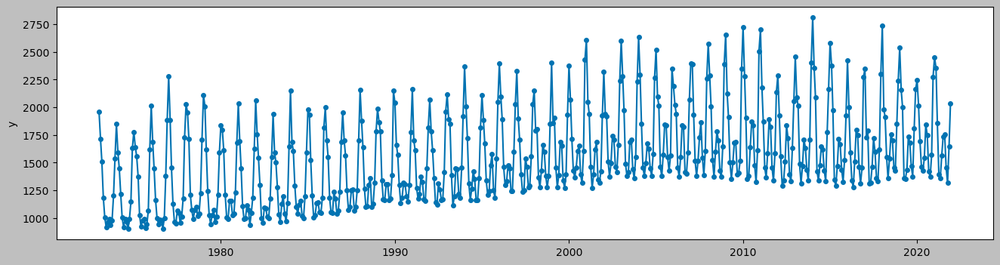

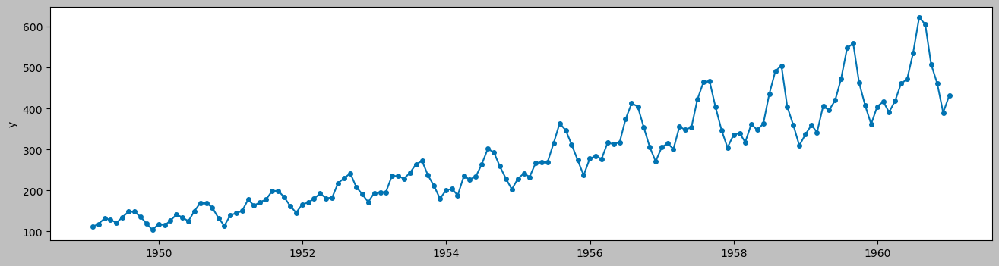

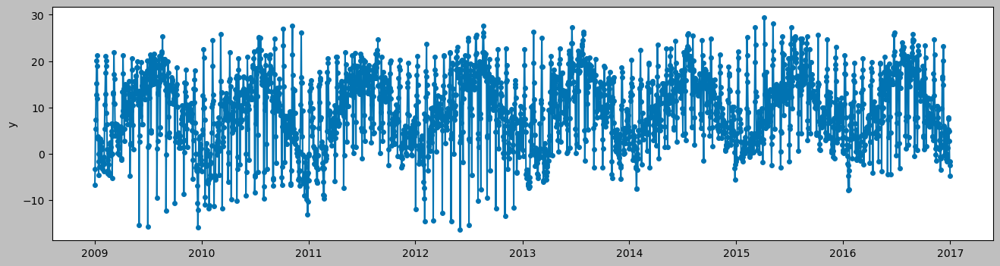

In [258]:
plotting.plot_series(energy_df)
plotting.plot_series(air_df)
plotting.plot_series(dw_df);

**Different ways to split your time series**


In [259]:
# train, test = split_data(df)

In [260]:
print(air_df.index.freq)
print(energy_df.index.freq)
print(dw_df.index.freq)

<MonthEnd>
<MonthBegin>
<Day>


In [261]:
144*0.10
288*0.10
2923*0.10

292.3

In [262]:
print(air_df.shape)
print(energy.shape)
print(dw_df.shape)

(144, 1)
(588, 1)
(2923, 1)


In [263]:
train_air, test_air = temporal_train_test_split(air_df,
                                                test_size=12)
train_en, test_en = temporal_train_test_split(energy_df, 
                                              test_size=24)
train_dw, test_dw = temporal_train_test_split(dw_df, 
                                              test_size=365)

In [264]:
print(train_air.shape)
print(train_en.shape)
print(train_dw.shape)

(132, 1)
(564, 1)
(2558, 1)


In [265]:
print(test_air.shape)
print(test_en.shape)
print(test_dw.shape)

(12, 1)
(24, 1)
(365, 1)


In [266]:
regressors = { 
    'Linear Regression': LinearRegression,
    'Random Forest Regression': lambda: RandomForestRegressor(),
    'Gradient Boosting Regression': lambda: GradientBoostingRegressor(),
    'Extra Tree Regression': lambda: ExtraTreesRegressor(),
    'Support Vector Regression (RBF)': lambda: SVR(kernel='rbf'),
    'Support Vector Regression (linear)': lambda: SVR(kernel='linear'),
    'K-Nearest Neighbor Regression': lambda: KNeighborsRegressor()
}

## Train

In [267]:
def train_model(train, test, reg, reg_name, strategy):
        
    fh = ForecastingHorizon(test.index, is_relative=False)
    
    forecaster = make_reduction(estimator=reg, 
                                window_length=10, 
                                strategy=strategy)
    print(f'training {reg_name} ...')
    forecaster.fit(train)
    yhat = forecaster.predict(fh)
    actual = test.copy()
    
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': forecaster, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors, strategy):
    results = []
    for reg_name, reg in regressors.items():
        results.append(train_model(train,
                                   test,
                                   reg(),
                                   reg_name,
                                   strategy))
    return results


In [268]:
air_results = train_different_models(train_air, 
                                     test_air, 
                                     regressors, 
                                     strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [269]:
en_results = train_different_models(train_en, 
                                    test_en, 
                                    regressors, 
                                    strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [270]:
test_dw.isna().sum()
test_dw[test_dw.isnull().any(axis=1)].index.tolist()

[Timestamp('2016-10-26 00:00:00'), Timestamp('2016-10-27 00:00:00')]

In [271]:
dw_results = train_different_models(train_dw, 
                                    test_dw.ffill(), 
                                    regressors, 
                                    strategy="recursive")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [272]:
pd.DataFrame(air_results)

,Model Name,Model,RMSE,MAPE,MASE,MAE,yhat,actual
0,Linear Regression,RecursiveTabularRegressionForecaster(estimator...,42.412083,0.082394,1.580819,38.072390,y 1960-01-31 453.787055 ...,y 1960-01-31 417 1960-02-29 39...
1,Random Forest Regression,RecursiveTabularRegressionForecaster(estimator...,63.733344,0.107670,2.156587,51.939167,y 1960-01-31 398.92 1960-02-...,y 1960-01-31 417 1960-02-29 39...
2,Gradient Boosting Regression,RecursiveTabularRegressionForecaster(estimator...,64.456230,0.106767,2.170642,52.277664,y 1960-01-31 405.656347 ...,y 1960-01-31 417 1960-02-29 39...
3,Extra Tree Regression,RecursiveTabularRegressionForecaster(estimator...,75.773655,0.108482,2.342395,56.414167,y 1960-01-31 412.27 1960-02-...,y 1960-01-31 417 1960-02-29 39...
4,Support Vector Regression (RBF),RecursiveTabularRegressionForecaster(estimator...,208.083827,0.397261,8.105170,195.204655,y 1960-01-31 282.044914 ...,y 1960-01-31 417 1960-02-29 39...
5,Support Vector Regression (linear),RecursiveTabularRegressionForecaster(estimator...,68.923982,0.120712,2.481277,59.759003,y 1960-01-31 447.819211 ...,y 1960-01-31 417 1960-02-29 39...
6,K-Nearest Neighbor Regression,RecursiveTabularRegressionForecaster(estimator...,77.779410,0.138049,2.811690,67.716667,y 1960-01-31 356.8 1960-02-29...,y 1960-01-31 417 1960-02-29 39...


## Evaluate Models

In [273]:
def evaluate_results(results, by='MASE'):
    cols = ['Model Name', by]
    df_sorted = results[cols].sort_values(by).reset_index(drop=True)
    return df_sorted

In [274]:
air_results_df = pd.DataFrame(air_results)
air_results_sorted = evaluate_results(air_results_df)
print(air_results_sorted.head(3))

                     Model Name      MASE
0             Linear Regression  1.580819
1      Random Forest Regression  2.156587
2  Gradient Boosting Regression  2.170642


In [275]:
en_results_df = pd.DataFrame(en_results)
en_results_sorted = evaluate_results(en_results_df)
print(en_results_sorted.head(3))

                      Model Name      MASE
0          Extra Tree Regression  0.402411
1  K-Nearest Neighbor Regression  0.423276
2              Linear Regression  0.516344


In [276]:
dw_results_df = pd.DataFrame(dw_results)
dw_results_sorted = evaluate_results(dw_results_df)
print(dw_results_sorted.head(3))

                           Model Name      MASE
0     Support Vector Regression (RBF)  1.777614
1                   Linear Regression  1.806715
2  Support Vector Regression (linear)  1.809778


In [277]:
def plot_results(results, data_name):
    cols = ['yhat', 'actual', 'Model Name']
    for row in results[cols].iterrows():
        yhat, actual, name = row[1]
        plt.title(f'{data_name} - {name}')
        plt.plot(actual, 'k--', alpha=0.5)
        plt.plot(yhat, 'k')
        plt.legend(['actual', 'forecast'])
        plt.show()


In [278]:
air_results_df[['yhat', 'actual', 'Model Name']]

,yhat,actual,Model Name
0,y 1960-01-31 453.787055 ...,y 1960-01-31 417 1960-02-29 39...,Linear Regression
1,y 1960-01-31 398.92 1960-02-...,y 1960-01-31 417 1960-02-29 39...,Random Forest Regression
2,y 1960-01-31 405.656347 ...,y 1960-01-31 417 1960-02-29 39...,Gradient Boosting Regression
3,y 1960-01-31 412.27 1960-02-...,y 1960-01-31 417 1960-02-29 39...,Extra Tree Regression
4,y 1960-01-31 282.044914 ...,y 1960-01-31 417 1960-02-29 39...,Support Vector Regression (RBF)
5,y 1960-01-31 447.819211 ...,y 1960-01-31 417 1960-02-29 39...,Support Vector Regression (linear)
6,y 1960-01-31 356.8 1960-02-29...,y 1960-01-31 417 1960-02-29 39...,K-Nearest Neighbor Regression


### Air Passenger Plots

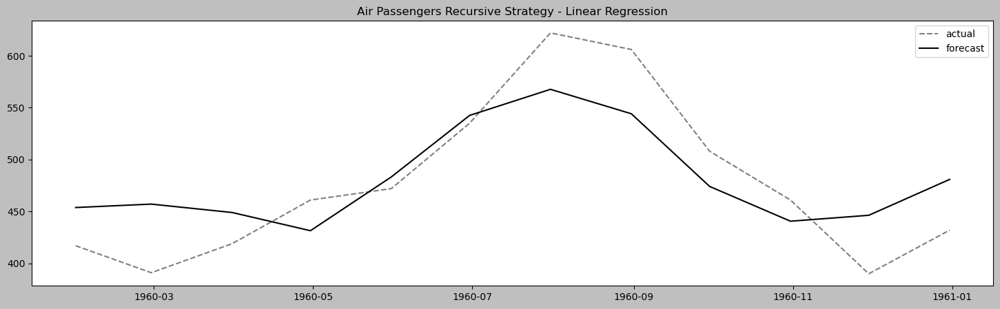

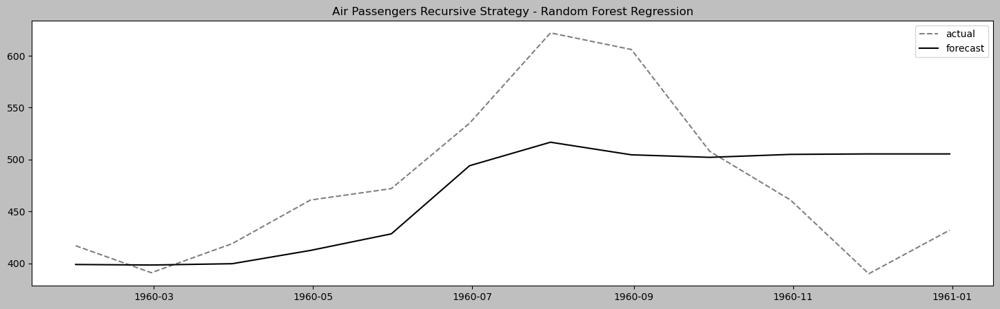

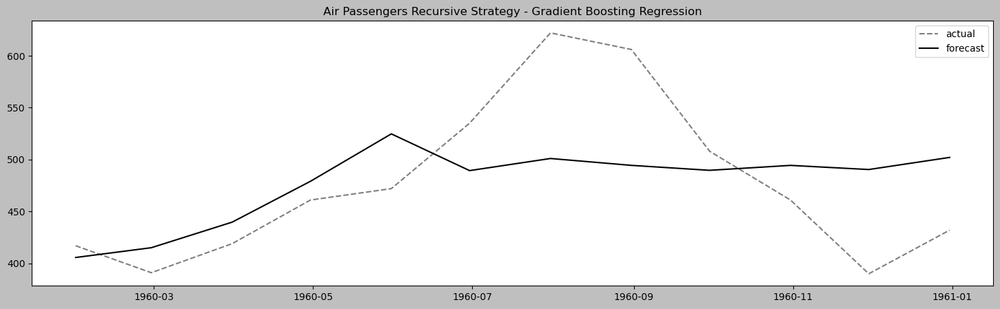

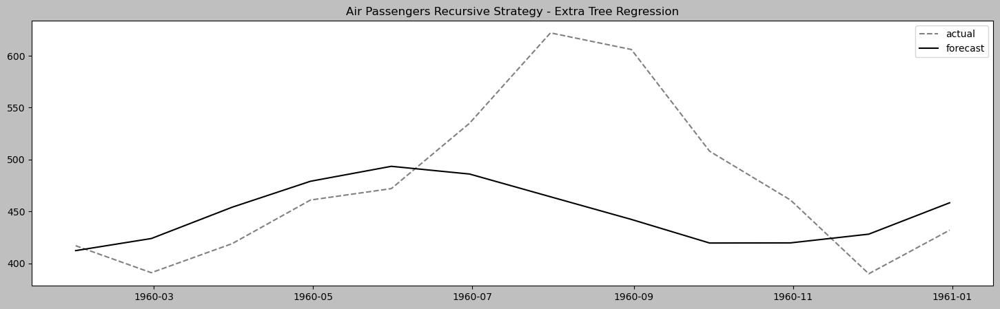

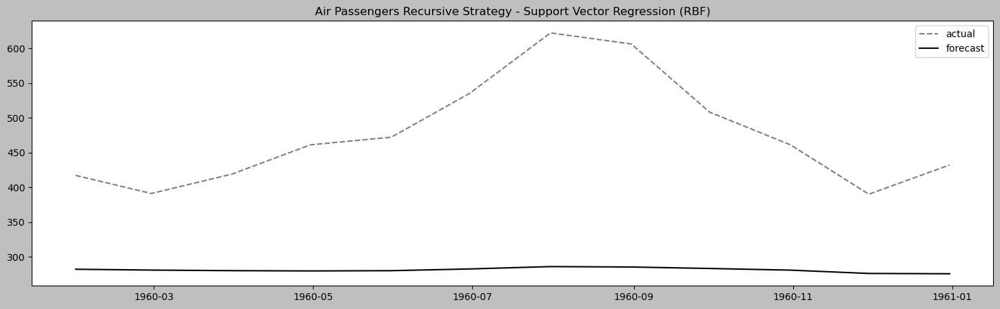

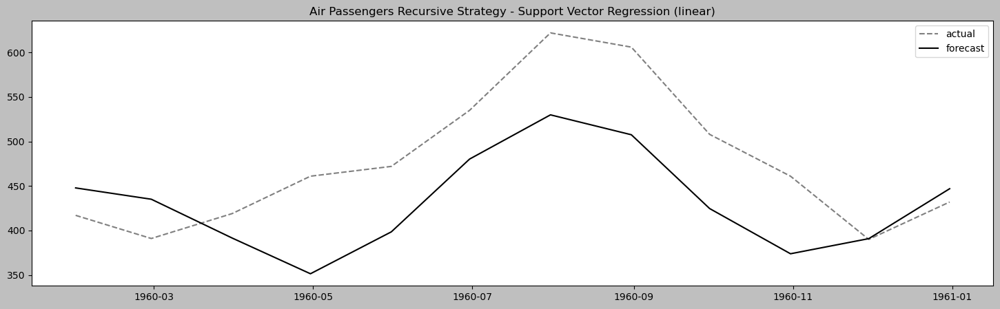

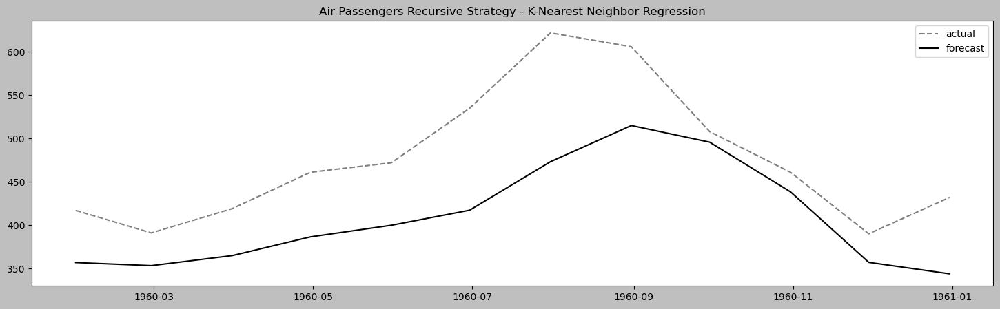

In [279]:
plot_results(air_results_df, 'Air Passengers Recursive Strategy')

### Energy Consumption Plots

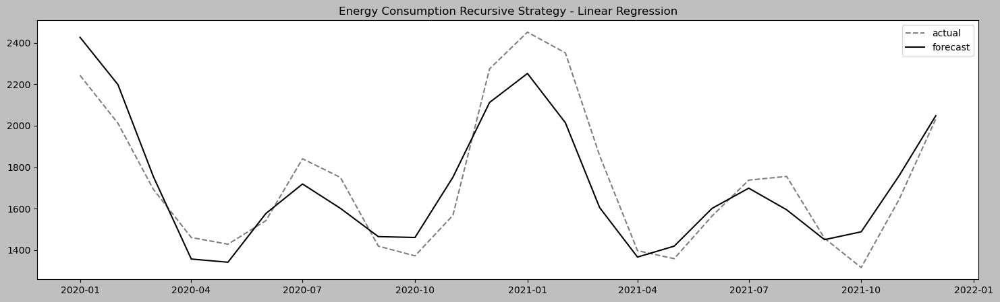

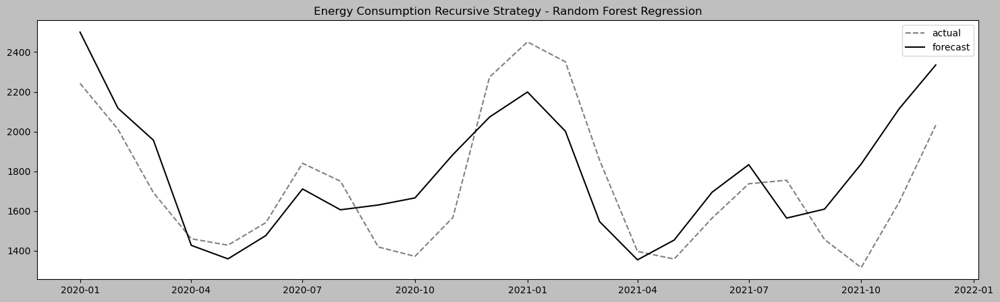

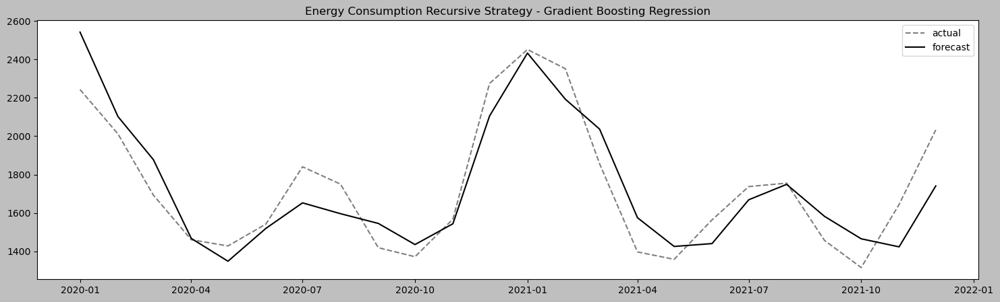

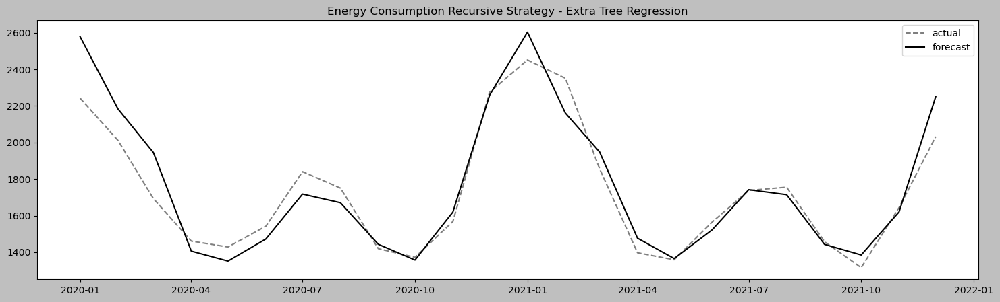

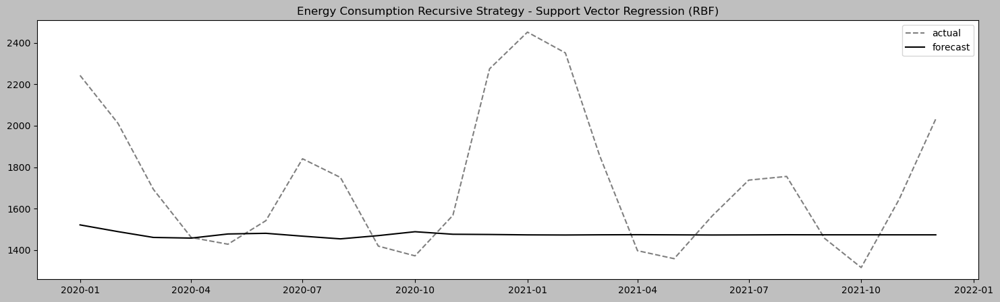

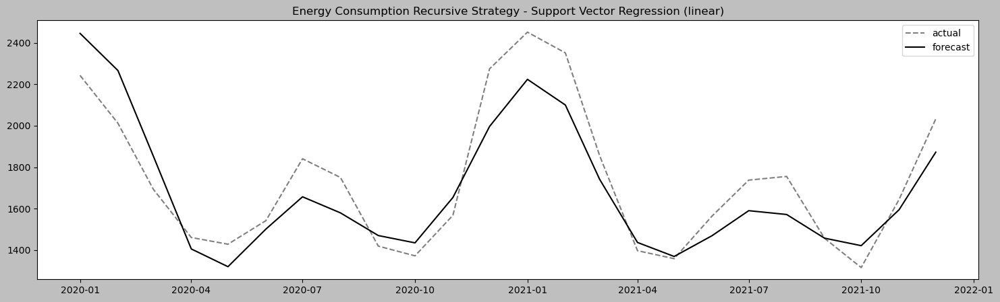

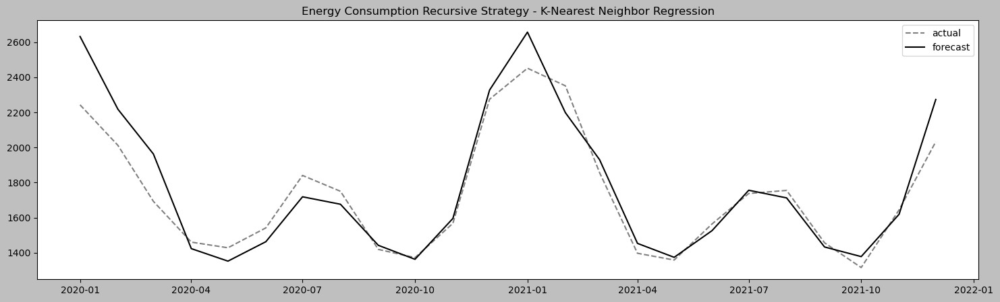

In [280]:
plot_results(en_results_df, 'Energy Consumption Recursive Strategy')

### Daily Temperature Plots

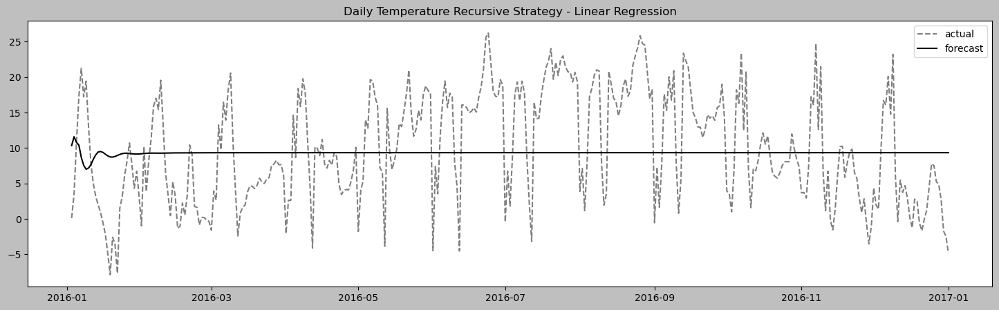

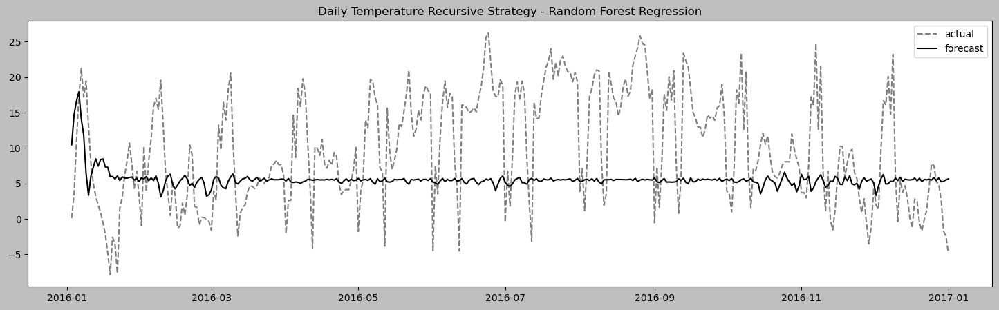

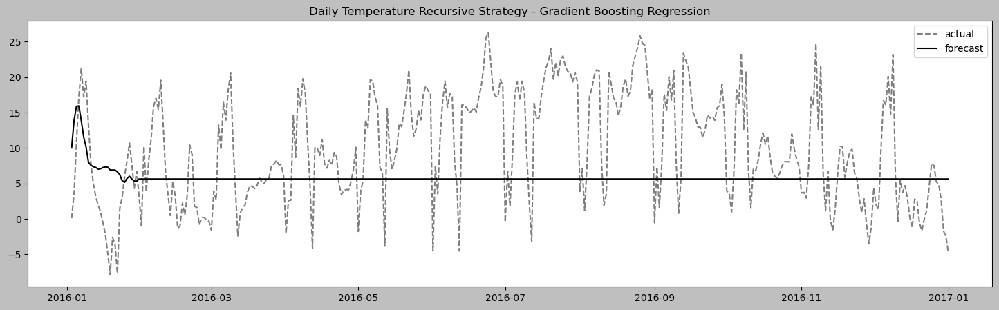

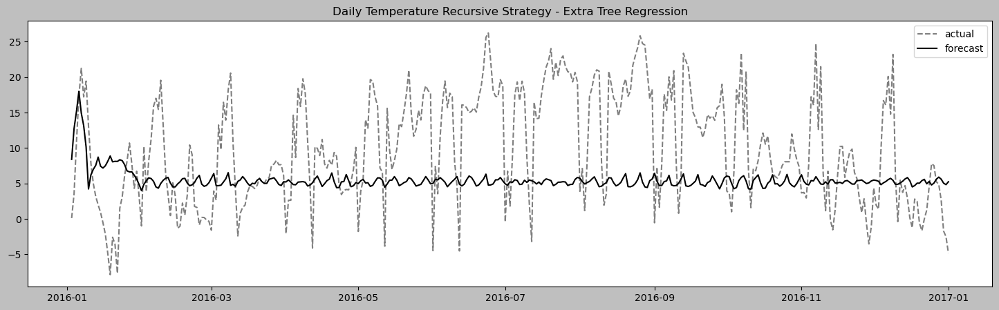

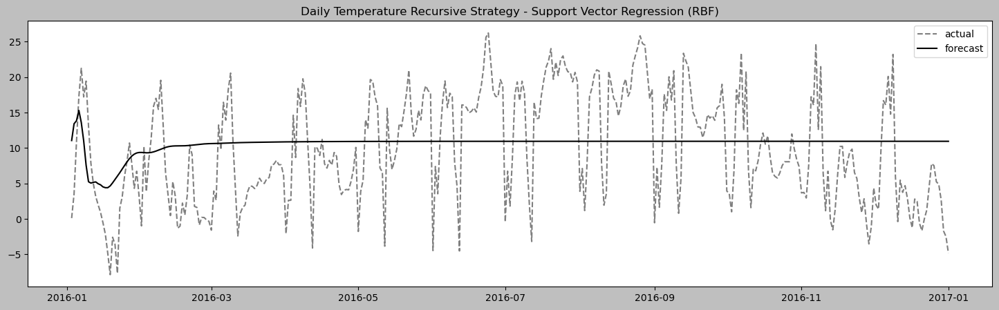

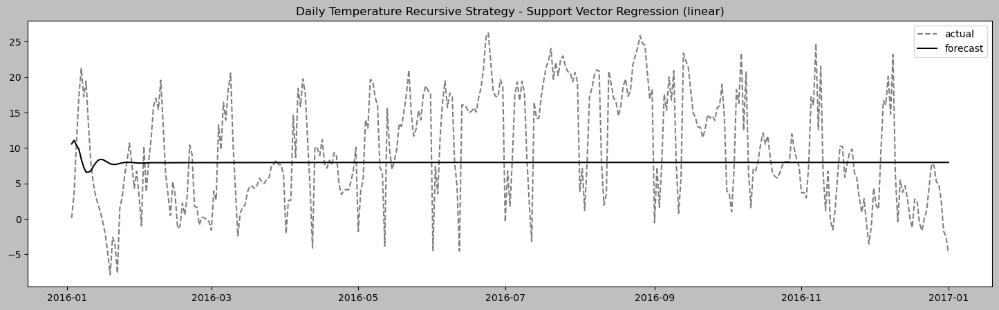

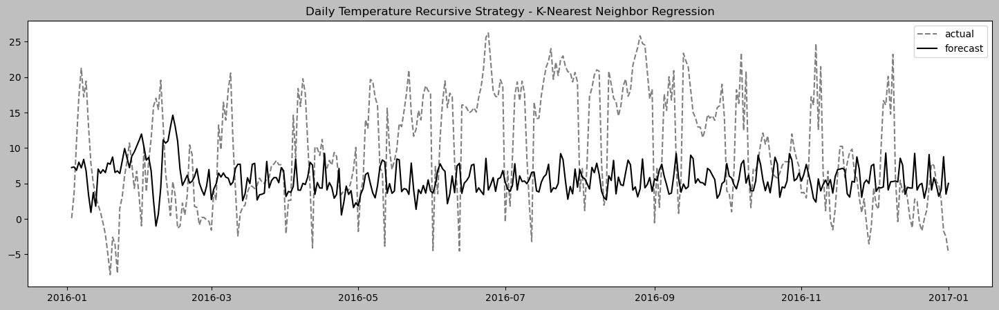

In [281]:
plot_results(dw_results_df, 'Daily Temperature Recursive Strategy')

## How it Works

### TabularRegressionForecaster Classes

In [282]:
make_reduction(RandomForestRegressor, strategy='recursive')

RecursiveTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

In [283]:
make_reduction(RandomForestRegressor, strategy='multioutput')

MultioutputTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

In [284]:
make_reduction(RandomForestRegressor, strategy='direct')

DirectTabularRegressionForecaster(estimator=<class 'sklearn.ensemble._forest.RandomForestRegressor'>)

```python
make_reduction(estimator, 
               strategy='recursive', 
               window_length=10, 
               scitype='infer')
```

## There is more

### Multioutput Strategy

In [292]:
# from sktime.forecasting.all import MultioutputTimeSeriesRegressionForecaster
from sklearn.multioutput import MultiOutputRegressor

def train_model(train, test, reg, reg_name, strategy):
    
        
    fh = ForecastingHorizon(test.index, is_relative=False)
    
    try:
        forecaster = make_reduction(estimator=reg, 
                                window_length=10, 
                                strategy=strategy)
        forecaster.fit(train, fh=fh)
        print(f'training {reg_name} ...')
    except:
        try:
            mo_reg = MultiOutputRegressor(reg)
            forecaster = make_reduction(estimator=mo_reg, 
                                window_length=10, 
                                strategy=strategy)
            forecaster.fit(train, fh=fh)
            print(f'using MultiOutputRegressor for {reg_name} ...')
        except Exception as e:
            print(f'Failed for {reg_name}: {e}')
        
    yhat = forecaster.predict(fh)
    actual = test.copy()
    
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': forecaster, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors, strategy):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor()
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name,
                                   strategy))
    return results

In [293]:
regressors

{'Linear Regression': sklearn.linear_model._base.LinearRegression,
 'Random Forest Regression': <function __main__.<lambda>()>,
 'Gradient Boosting Regression': <function __main__.<lambda>()>,
 'Extra Tree Regression': <function __main__.<lambda>()>,
 'Support Vector Regression (RBF)': <function __main__.<lambda>()>,
 'Support Vector Regression (linear)': <function __main__.<lambda>()>,
 'K-Nearest Neighbor Regression': <function __main__.<lambda>()>}

### Train multioutput

In [294]:
air_results_mo = train_different_models(train_air, test_air, regressors, "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [297]:
en_results_mo = train_different_models(train_en, test_en, regressors, "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [298]:
dw_results_mo = train_different_models(train_dw, test_dw.fillna(0), regressors, "multioutput")

training Linear Regression ...
training Random Forest Regression ...
using MultiOutputRegressor for Gradient Boosting Regression ...
training Extra Tree Regression ...
using MultiOutputRegressor for Support Vector Regression (RBF) ...
using MultiOutputRegressor for Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


### Evaluate

In [302]:
air_results_mo_df = pd.DataFrame(air_results_mo)
air_results_mo_sorted = evaluate_results(air_results_mo_df)
print(air_results_mo_sorted.head(3))

                           Model Name      MASE
0                   Linear Regression  0.800119
1  Support Vector Regression (linear)  0.831891
2        Gradient Boosting Regression  1.717006


In [303]:
en_results_mo_df = pd.DataFrame(en_results_mo)
en_results_mo_sorted = evaluate_results(en_results_mo_df)
print(en_results_mo_sorted.head(3))

                      Model Name      MASE
0       Random Forest Regression  0.338836
1          Extra Tree Regression  0.344285
2  K-Nearest Neighbor Regression  0.384354


In [304]:
dw_results_mo_df = pd.DataFrame(dw_results_mo)
dw_results_mo_sorted = evaluate_results(dw_results_mo_df)
print(dw_results_mo_sorted.head(3))

                        Model Name      MASE
0  Support Vector Regression (RBF)  1.519407
1            Extra Tree Regression  1.578906
2     Gradient Boosting Regression  1.642015


#### Air Passenger Plot

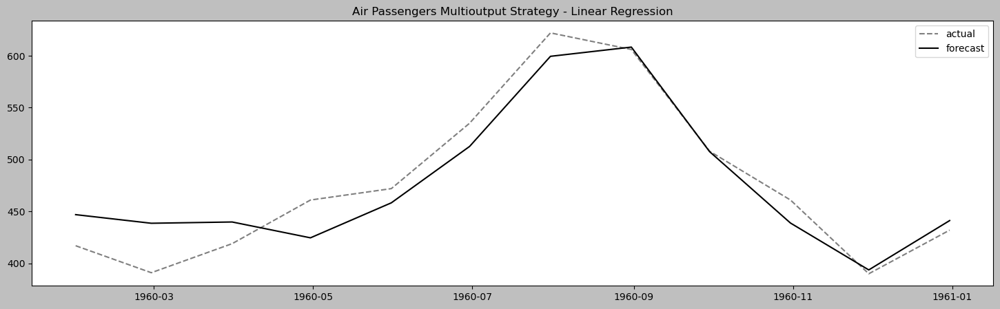

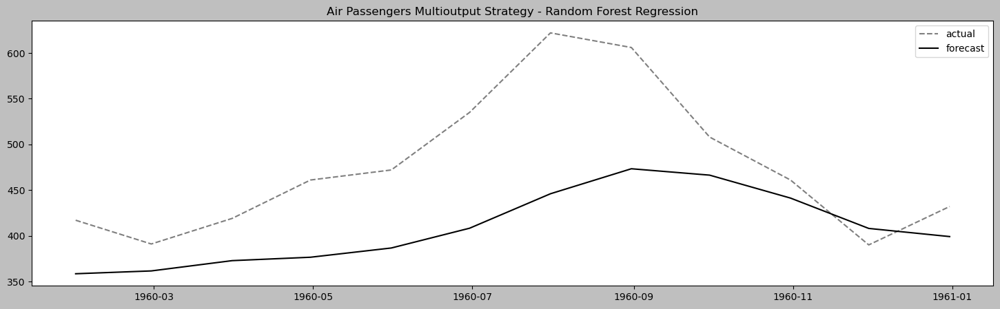

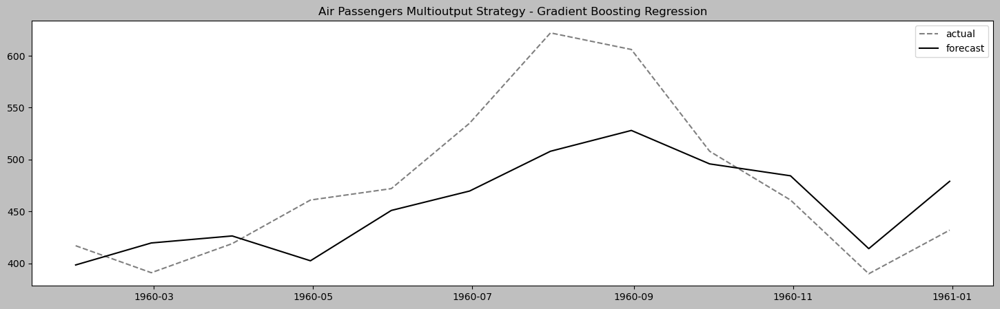

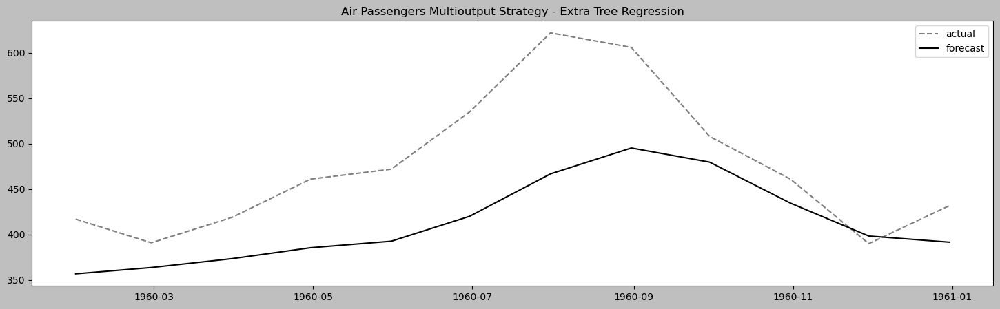

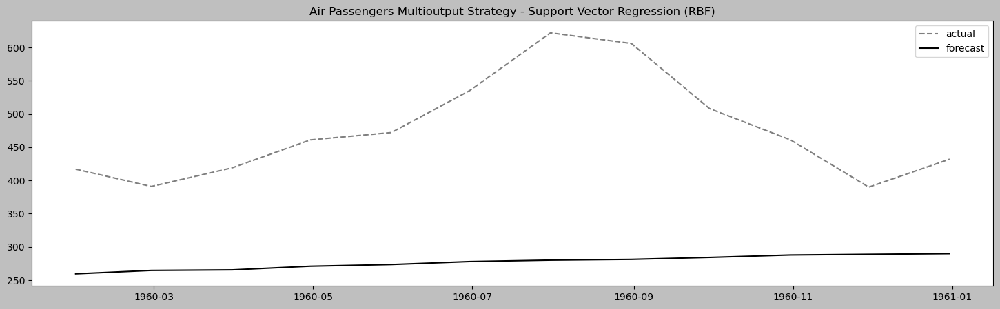

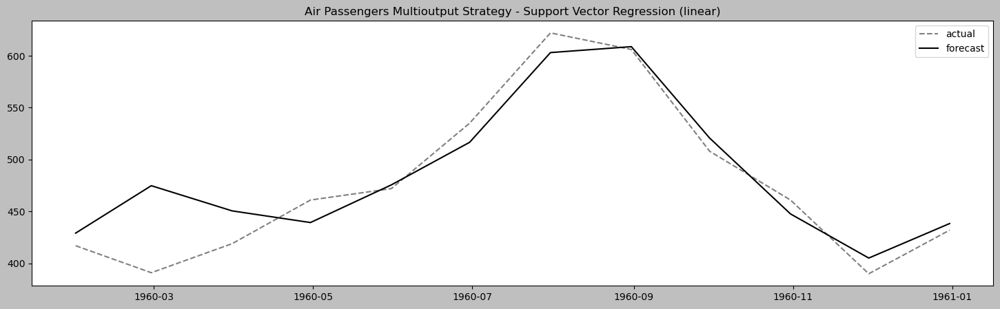

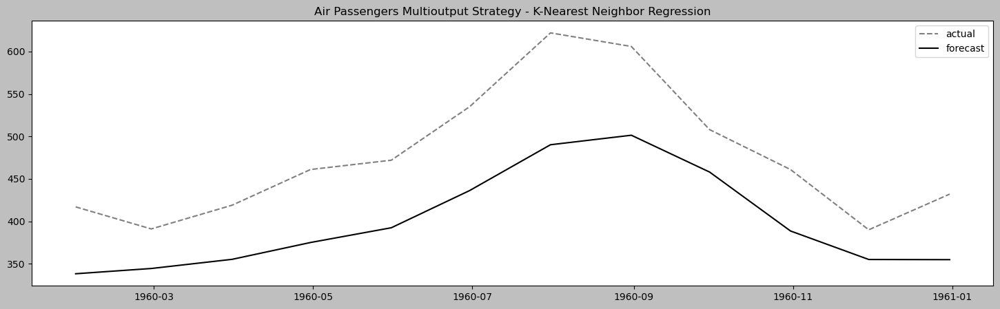

In [152]:
plot_results(air_results_mo_df, 'Air Passengers Multioutput Strategy')

#### Energy Consumption Plots

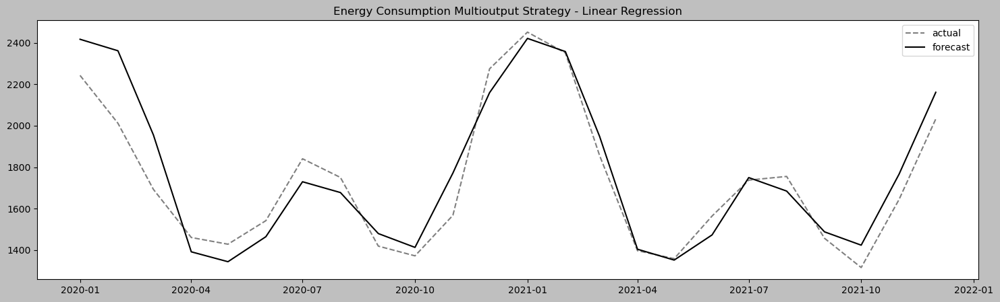

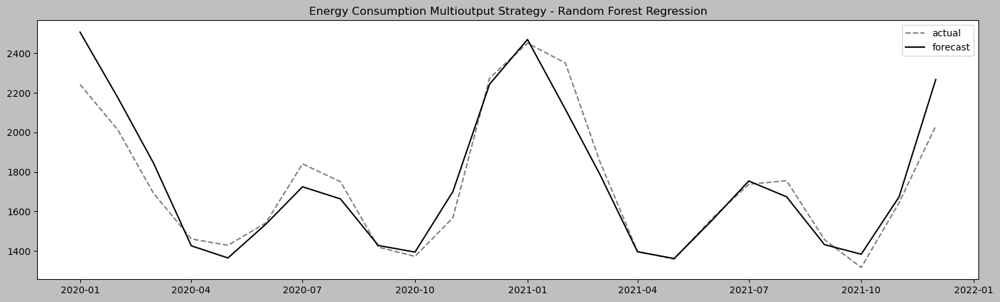

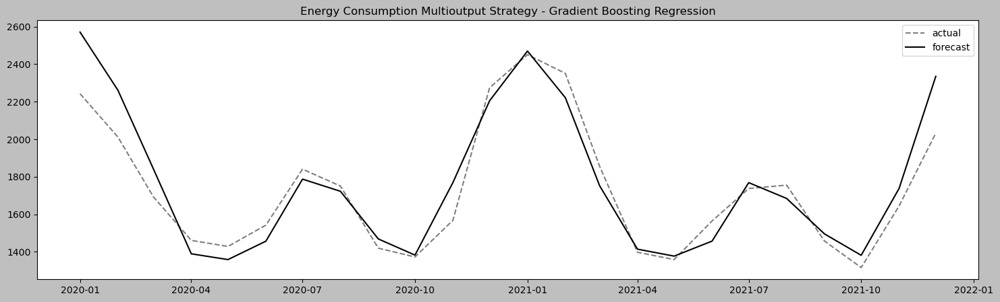

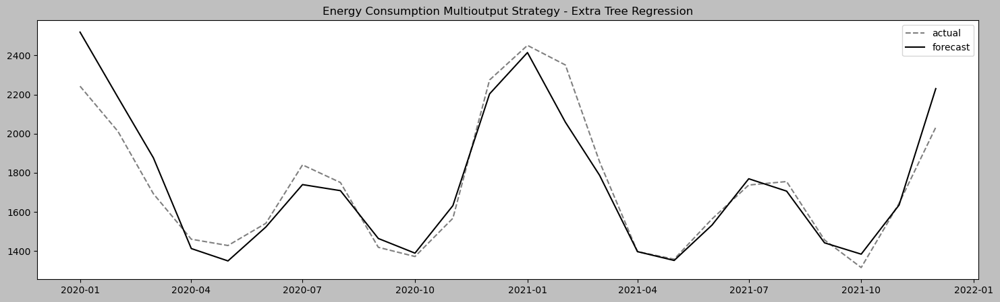

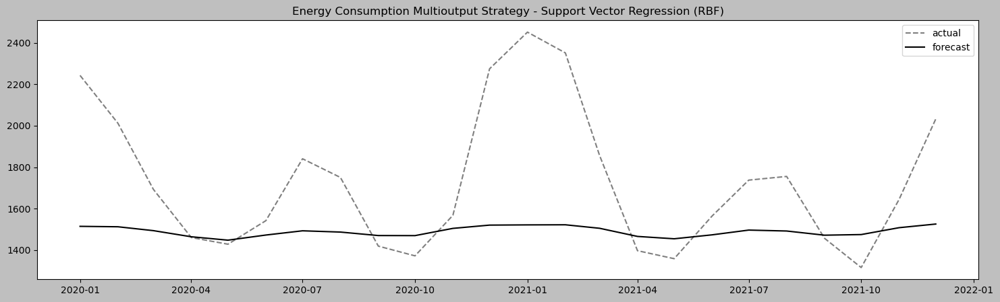

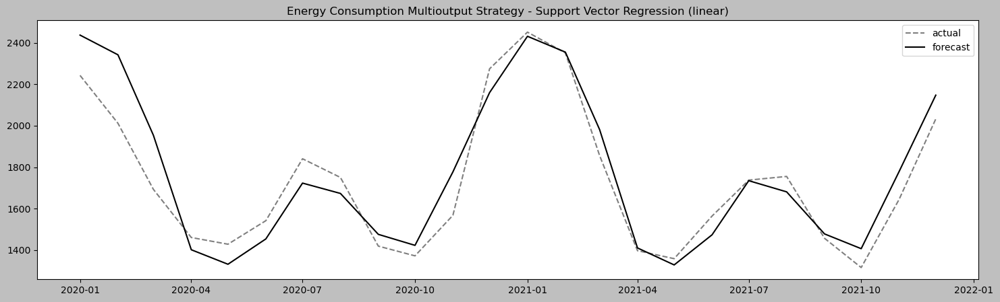

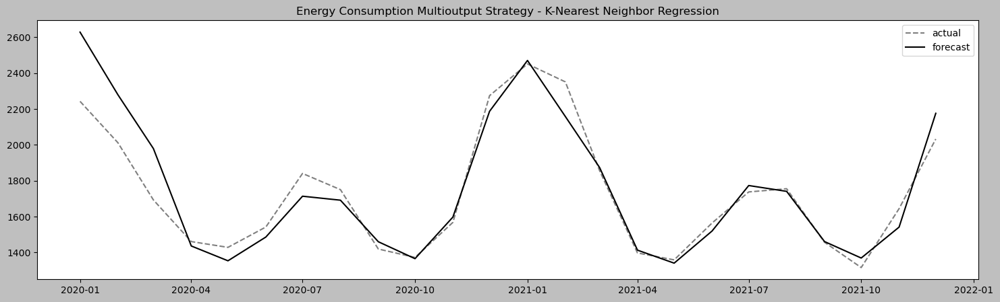

In [140]:
plot_results(en_results_mo_df, 'Energy Consumption Multioutput Strategy')

#### Daily Temperature Plots

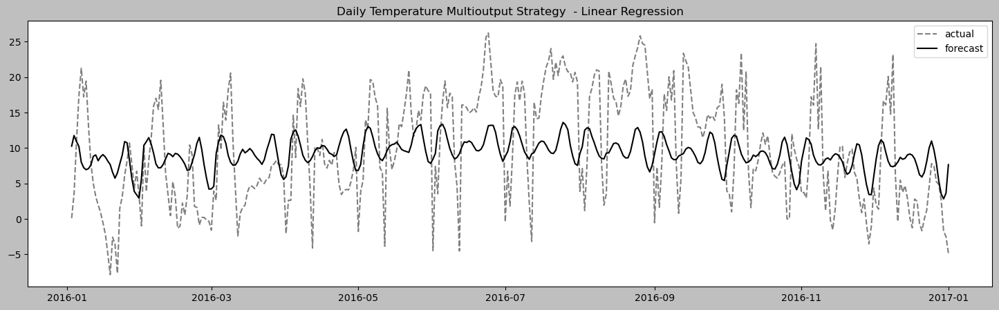

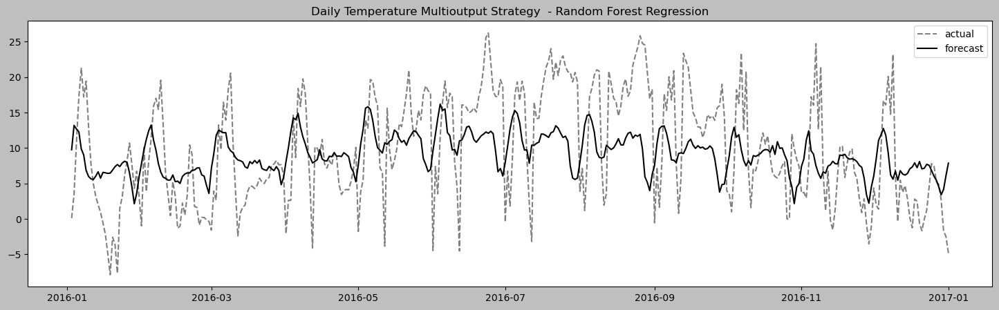

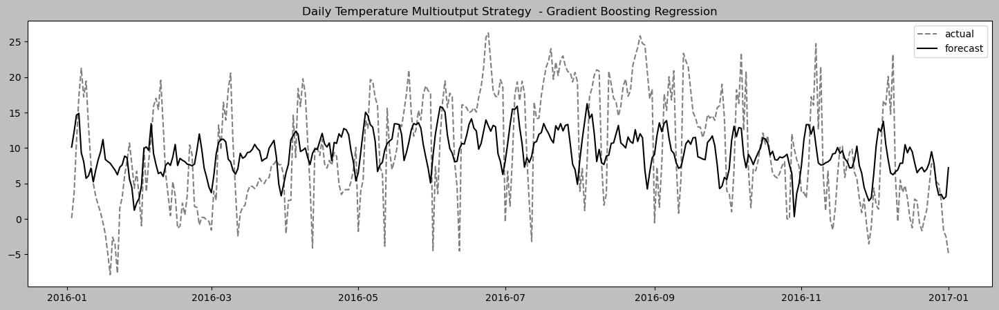

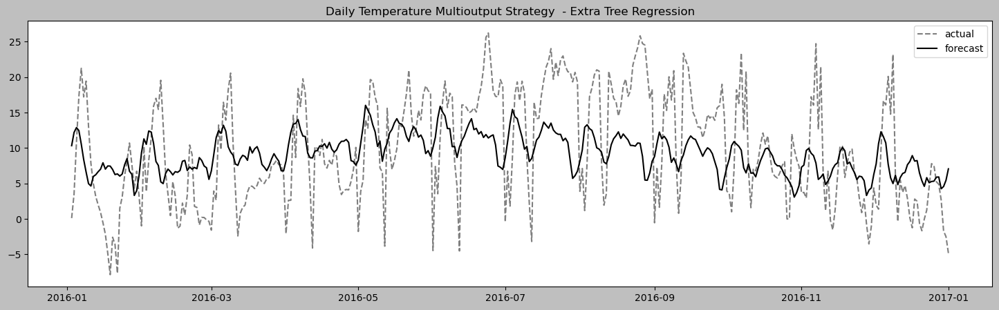

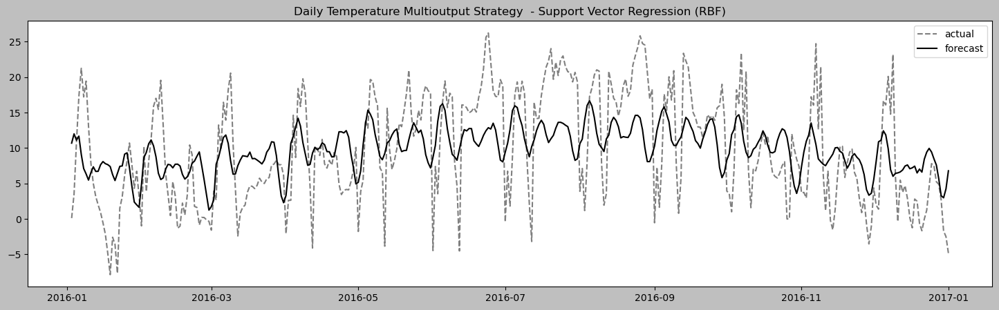

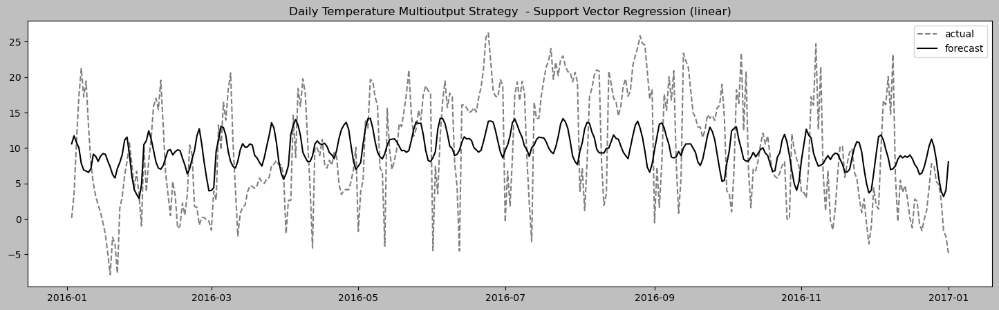

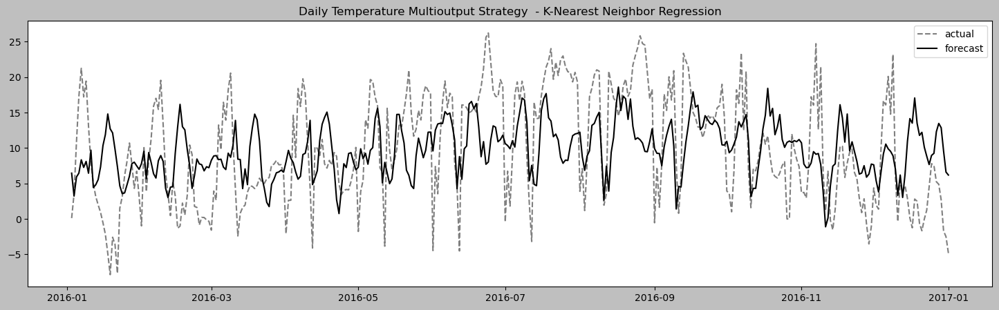

In [141]:
plot_results(dw_results_mo_df, 'Daily Temperature Multioutput Strategy ')

### Direct Strategy

### Train Direct

In [305]:
air_results_dir = train_different_models(train_air, test_air, regressors, "direct")

training Linear Regression ...
training Random Forest Regression ...
training Gradient Boosting Regression ...
training Extra Tree Regression ...
training Support Vector Regression (RBF) ...
training Support Vector Regression (linear) ...
training K-Nearest Neighbor Regression ...


In [143]:
#dw_results_dir = train_different_models(train_dw, test_dw.fillna(0), regressors, "direct")

In [144]:
#en_results_dir = train_different_models(train_en, test_en, regressors, "direct")

In [306]:
air_results_dir_df = pd.DataFrame(air_results_dir)
air_results_dir_sorted = evaluate_results(air_results_dir_df)
print(air_results_dir_sorted.head(3))

                           Model Name      MASE
0                   Linear Regression  0.800119
1  Support Vector Regression (linear)  0.831891
2               Extra Tree Regression  1.415880


In [307]:
# en_results_dir_df = pd.DataFrame(en_results_dir)
# en_results_dir_sorted = evaluate_results(en_results_dir_df)
# print(en_results_dir_sorted.head(3))

In [308]:
# dw_results_dir_df = pd.DataFrame(dw_results_dir)
# dw_results_dir_sorted = evaluate_results(dw_results_dir_df)
# print(dw_results_dir_sorted.head(3))

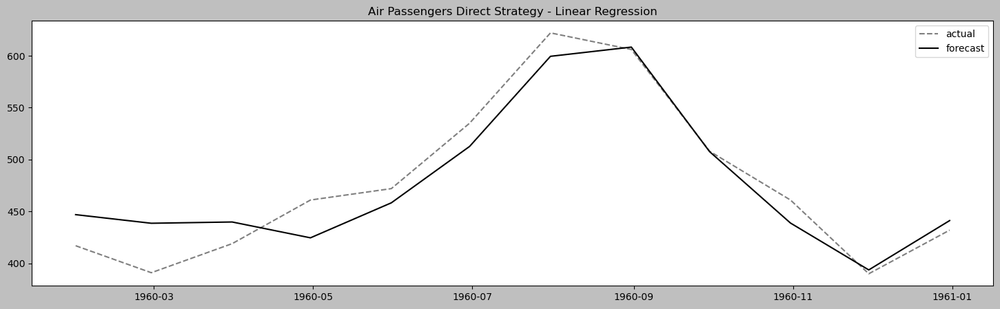

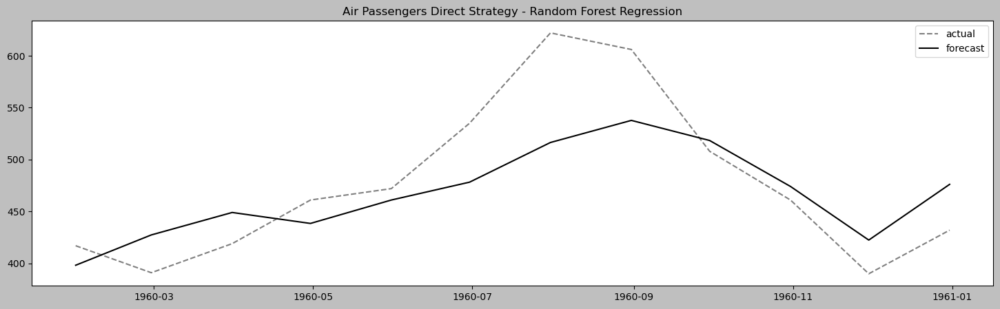

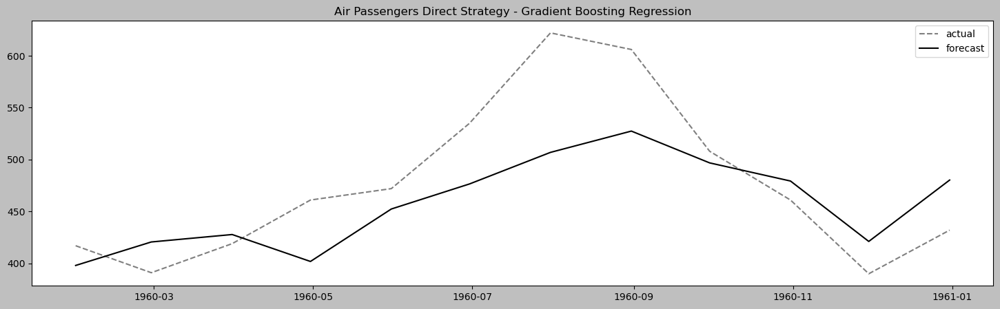

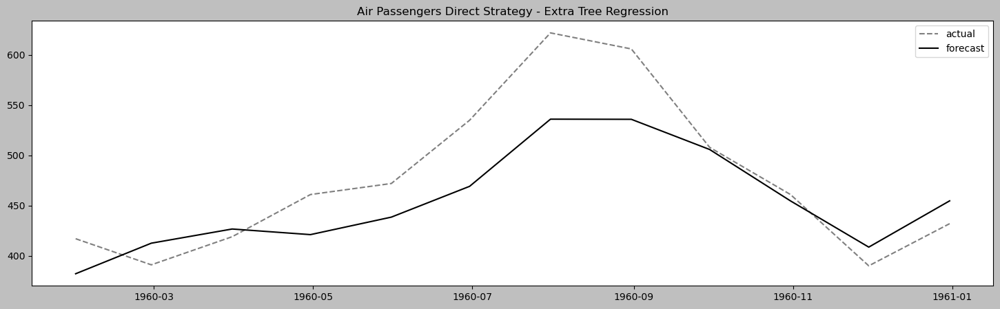

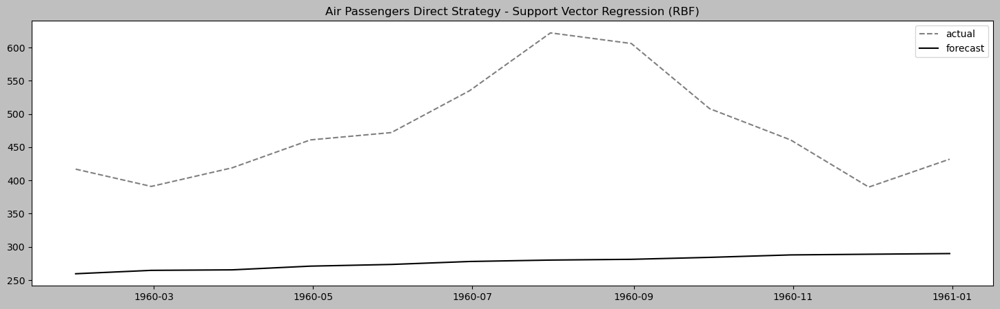

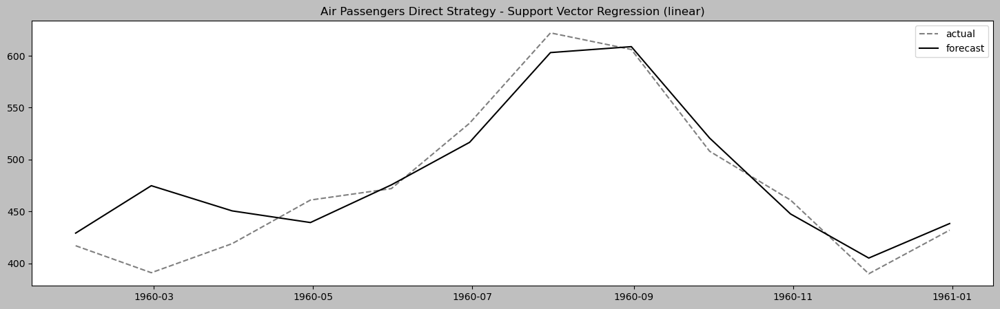

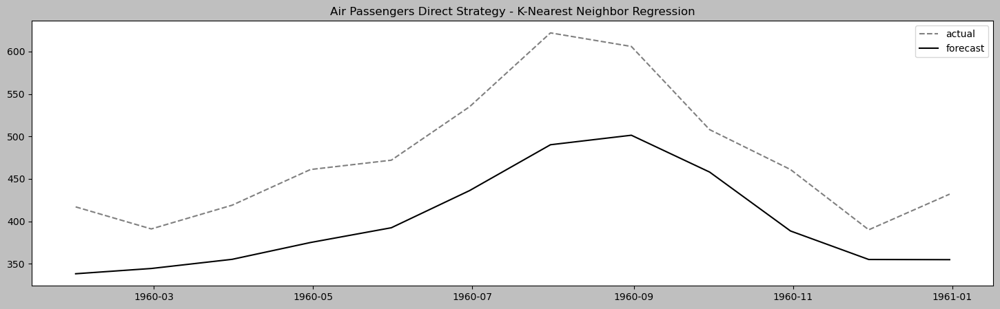

In [309]:
plot_results(air_results_dir_df, 'Air Passengers Direct Strategy')

# Recipe 5. Hyperparameter Tuning with sktime

In [310]:
from sktime.forecasting.all import (ForecastingGridSearchCV, 
                                    ExpandingWindowSplitter)

### Load Data

In [311]:
energy_df = energy.copy()
air_df = air.copy()
dw_df = daily_temp.copy()


train_air, test_air = temporal_train_test_split(air_df,
                                                test_size=12)
train_en, test_en = temporal_train_test_split(energy_df, 
                                              test_size=24)
train_dw, test_dw = temporal_train_test_split(dw_df, 
                                              test_size=365)

### Define the Grid Search

In [420]:
# rf_param_grid = {"estimator__n_estimators" : [100, 200, 500],
#                 "estimator__max_depth": [10, 15, None],
#                 "estimator__min_samples_split": [2, 5, 10],
#                 "estimator__min_samples_leaf": [1,2,4]}

# # gb_param_grid = {"estimator__n_estimators" : [100, 200, 300],
# #                 "estimator__learning_rate": [0.1, 0.01, 0.2],
# #                 "estimator__max_depth": [3, 5, 7],
# #                 "estimator__loss": ['squared_error', 'absolute_error', 'huber']}

# knn_param_grid = {"estimator__n_neighbors" : [3, 5, 7, 10],
#                 "estimator__weights": ['uniform', 'distance'],
#                 "estimator__p": [1, 2]}

# # etree_param_grid = {"estimator__n_estimators" : [100, 200, 500],
# #                    "estimator__max_depth": [10, 15, None],
# #                    "estimator__min_samples_split": [2, 5, 10],
# #                    "estimator__min_samples_leaf": [1,2,4]}

# svr_param_grid = {"kernel": ['linear', 'poly', 'rbf', 'sigmoid']}

# # lr_param_grid = {'fit_intercept': [True, False]}

In [369]:
# random forest parameters
rf_param_grid = {"n_estimators" : [100, 200, 500],
                "max_depth": [10, 15, None],
                "min_samples_split": [2, 5, 10],
                "min_samples_leaf": [1,2,4]}

# gb_param_grid = {"estimator__n_estimators" : [100, 200, 300],
#                 "estimator__learning_rate": [0.1, 0.01, 0.2],
#                 "estimator__max_depth": [3, 5, 7],
#                 "estimator__loss": ['squared_error', 'absolute_error', 'huber']}

# KNN parameters
knn_param_grid = {"n_neighbors" : [3, 5, 7, 10],
                "weights": ['uniform', 'distance'],
                "p": [1, 2]}

# etree_param_grid = {"estimator__n_estimators" : [100, 200, 500],
#                    "estimator__max_depth": [10, 15, None],
#                    "estimator__min_samples_split": [2, 5, 10],
#                    "estimator__min_samples_leaf": [1,2,4]}

# SVR parameters
svr_param_grid = {"kernel": ['linear', 'poly', 'rbf', 'sigmoid']}

# lr_param_grid = {'fit_intercept': [True, False]}

### Define the Regressors

In [442]:
ForecastingHorizon(test_air.index, is_relative=False)

ForecastingHorizon(['1960-01-31', '1960-02-29', '1960-03-31', '1960-04-30',
               '1960-05-31', '1960-06-30', '1960-07-31', '1960-08-31',
               '1960-09-30', '1960-10-31', '1960-11-30', '1960-12-31'],
              dtype='datetime64[ns]', name='date', freq='ME', is_relative=False)

## Train

In [497]:
def train_model(train, test, reg, reg_name, param_grid):

    fh = ForecastingHorizon(test.index, is_relative=False)
    
    initial_window = len(train) // 3
    step_length = (len(train) - initial_window) // 5
    
    cv = ExpandingWindowSplitter(initial_window=initial_window, step_length=step_length, fh=[1])
    
    try:
        m_reg = MultiOutputRegressor(reg)
        forecaster = make_reduction(estimator=m_reg, 
                                window_length=10, 
                                strategy="multioutput")
        
        gscv = ForecastingGridSearchCV(
                        forecaster=forecaster,
                        param_grid=param_grid,
                        cv=cv,
                        verbose=1)

        gscv.fit(train, fh=fh)
        print(f'Grid Search CV using MultiOutputRegressor for {reg_name} ...')
    except Exception as e:
        print(f'Failed for {reg_name}: {e}')
        return

    yhat = gscv.predict(fh)
    actual = test.copy()
    
    rmse_test = np.sqrt(mse(actual, yhat))
    mae_test = mae(actual, yhat)
    mape_test = mape(actual, yhat)
    mase_test = mase(actual, yhat, y_train=(train))

    model_metadata = {
        'Model Name': reg_name, 
        'Model': gscv, 
        'RMSE': rmse_test, 
        'MAPE': mape_test,
        'MASE': mase_test,
        'MAE': mae_test,
        'yhat': yhat, 
        'actual': actual}
    
    return model_metadata

def train_different_models(train, test, regressors):
    results = []
    for reg_name, regressor in regressors.items():
        reg = regressor[0]()
        param_grid = regressor[1]
        results.append(train_model(train,
                                   test,
                                   reg,
                                   reg_name, 
                                   param_grid))
    return results

In [498]:
air_results_gs = train_different_models(train_air, test_air, regressors)

Fitting 6 folds for each of 81 candidates, totalling 486 fits
Grid Search CV using MultiOutputRegressor for Random Forest Regresor ...
Fitting 6 folds for each of 16 candidates, totalling 96 fits
Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 6 folds for each of 4 candidates, totalling 24 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...


In [508]:
en_results_gs = train_different_models(train_en, test_en, regressors)

Fitting 6 folds for each of 81 candidates, totalling 486 fits
Grid Search CV using MultiOutputRegressor for Random Forest Regresor ...
Fitting 6 folds for each of 16 candidates, totalling 96 fits
Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 6 folds for each of 4 candidates, totalling 24 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...


In [509]:
dw_results_gs = train_different_models(train_dw, test_dw.fillna(0), regressors)

Fitting 6 folds for each of 81 candidates, totalling 486 fits
Grid Search CV using MultiOutputRegressor for Random Forest Regresor ...
Fitting 6 folds for each of 16 candidates, totalling 96 fits
Grid Search CV using MultiOutputRegressor for K-Nearest Neighbor Regressor ...
Fitting 6 folds for each of 4 candidates, totalling 24 fits
Grid Search CV using MultiOutputRegressor for Support Vector Regression ...


## Evaluate

In [ ]:
gscv = ForecastingGridSearchCV(
    forecaster=forecaster,
    param_grid=param_grid,
    cv=cv,
    verbose=1)

In [598]:
train_en.shape

(564, 1)

In [590]:
def get_best_params(df):
    for row in df.iterrows():
        print(row[1]['Model Name'])
        display(row[1]['Model'])
        print(row[1]['Model'].best_params_)
        display(row[1]['Model'].best_forecaster_)

In [591]:
air_results_gs_df = pd.DataFrame(air_results_gs)
air_results_gs_sorted = evaluate_results(air_results_gs_df)
print(air_results_gs_sorted)

                     Model Name      MASE
0     Support Vector Regression  0.831891
1        Random Forest Regresor  2.032238
2  K-Nearest Neighbor Regressor  3.368311


In [592]:
get_best_params(air_results_gs_df)

Random Forest Regresor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=44,
                                                   step_length=17),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor())),
                        param_grid={'max_depth': [10, 15, None],
                                    'min_samples_leaf': [1, 2, 4],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200, 500]},
                        verbose=1)

{'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor(max_depth=10,
                                                     min_samples_split=10)))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=44,
                                                   step_length=17),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor())),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 10, 'p': 2, 'weights': 'distance'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor(n_neighbors=10,
                                                   weights='distance')))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=44,
                                                   step_length=17),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR())),
                        param_grid={'kernel': ['linear', 'poly', 'rbf',
                                               'sigmoid']},
                        verbose=1)

{'kernel': 'linear'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR(kernel='linear')))

In [593]:
en_results_gs_df = pd.DataFrame(en_results_gs)
en_results_mo_sorted = evaluate_results(en_results_gs_df)
print(en_results_mo_sorted)

                     Model Name      MASE
0  K-Nearest Neighbor Regressor  0.358329
1        Random Forest Regresor  0.407673
2     Support Vector Regression  0.500095


In [594]:
get_best_params(en_results_gs_df)

Random Forest Regresor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=188,
                                                   step_length=75),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor())),
                        param_grid={'max_depth': [10, 15, None],
                                    'min_samples_leaf': [1, 2, 4],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200, 500]},
                        verbose=1)

{'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor(max_depth=10,
                                                     n_estimators=200)))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=188,
                                                   step_length=75),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor())),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor(n_neighbors=7, p=1)))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=188,
                                                   step_length=75),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR())),
                        param_grid={'kernel': ['linear', 'poly', 'rbf',
                                               'sigmoid']},
                        verbose=1)

{'kernel': 'poly'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR(kernel='poly')))

In [595]:
dw_results_gs_df = pd.DataFrame(dw_results_gs)
dw_results_mo_sorted = evaluate_results(dw_results_gs_df)
print(dw_results_mo_sorted)

                     Model Name      MASE
0     Support Vector Regression  1.519407
1        Random Forest Regresor  1.683255
2  K-Nearest Neighbor Regressor  1.882017


In [596]:
get_best_params(dw_results_gs_df)

Random Forest Regresor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=852,
                                                   step_length=341),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor())),
                        param_grid={'max_depth': [10, 15, None],
                                    'min_samples_leaf': [1, 2, 4],
                                    'min_samples_split': [2, 5, 10],
                                    'n_estimators': [100, 200, 500]},
                        verbose=1)

{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=RandomForestRegressor(max_depth=10,
                                                     min_samples_leaf=4,
                                                     min_samples_split=10)))

K-Nearest Neighbor Regressor


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=852,
                                                   step_length=341),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor())),
                        param_grid={'n_neighbors': [3, 5, 7, 10], 'p': [1, 2],
                                    'weights': ['uniform', 'distance']},
                        verbose=1)

{'n_neighbors': 3, 'p': 2, 'weights': 'distance'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=KNeighborsRegressor(n_neighbors=3,
                                                   weights='distance')))

Support Vector Regression


ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=[1], initial_window=852,
                                                   step_length=341),
                        forecaster=MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR())),
                        param_grid={'kernel': ['linear', 'poly', 'rbf',
                                               'sigmoid']},
                        verbose=1)

{'kernel': 'rbf'}


MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()))

### Air Passenger Plot

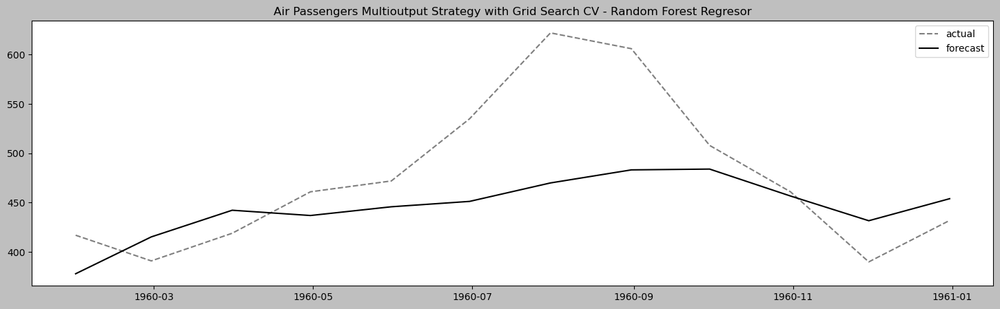

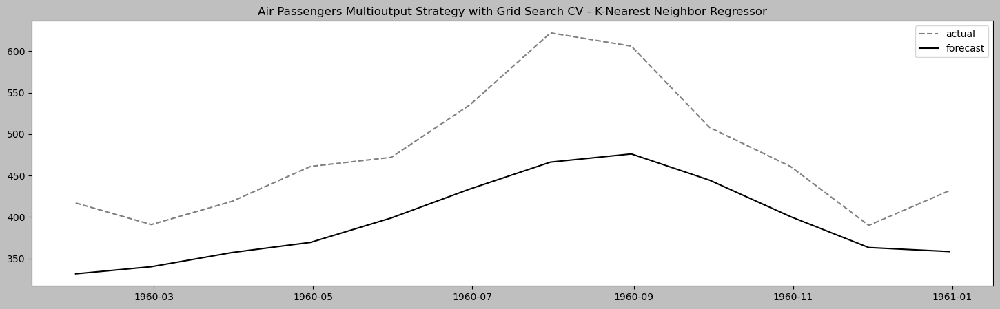

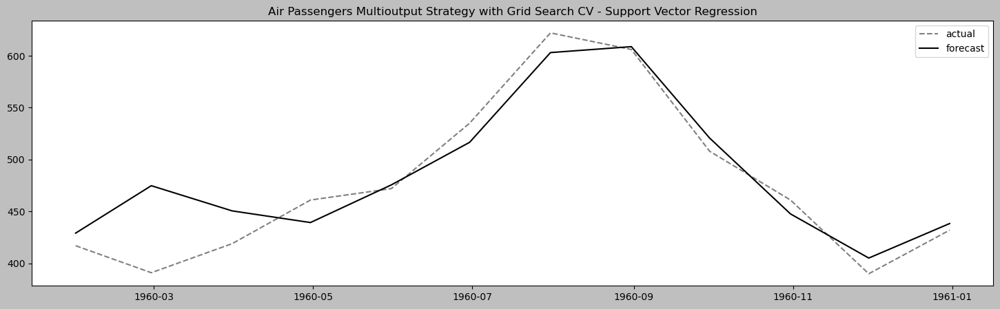

In [522]:
plot_results(air_results_gs_df, 'Air Passengers Multioutput Strategy with Grid Search CV')

### Energy Consumption Plot

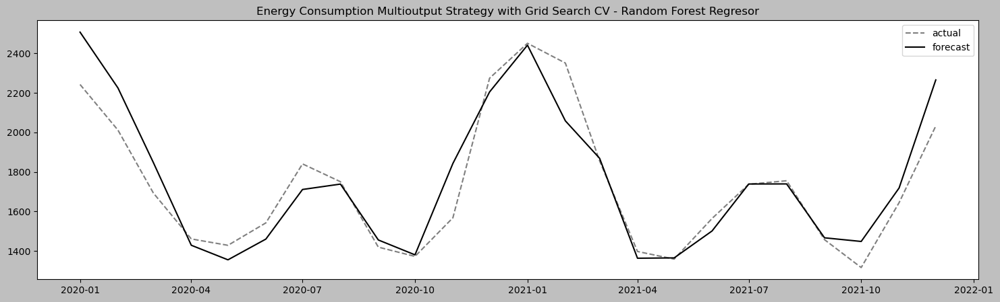

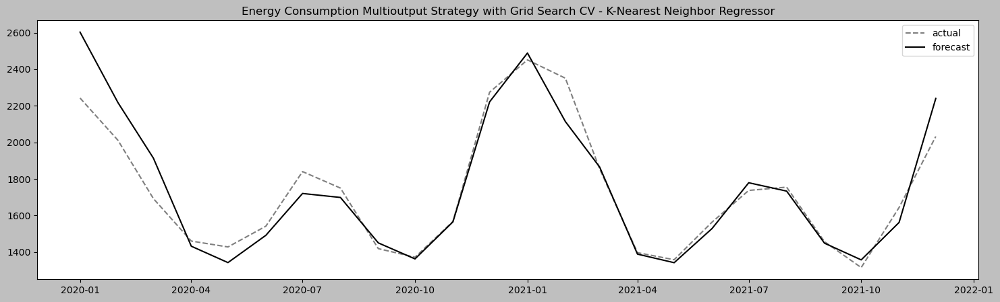

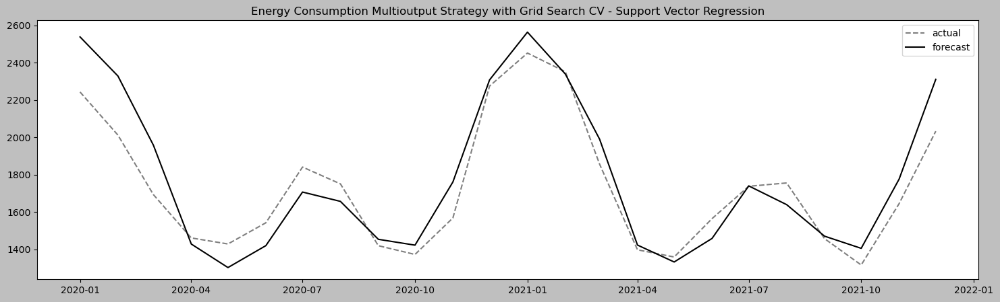

In [523]:
plot_results(en_results_gs_df, 'Energy Consumption Multioutput Strategy with Grid Search CV')

### Daily Temperature

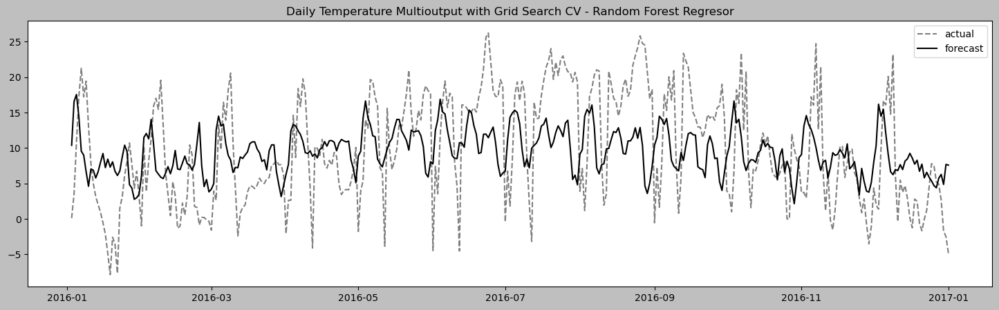

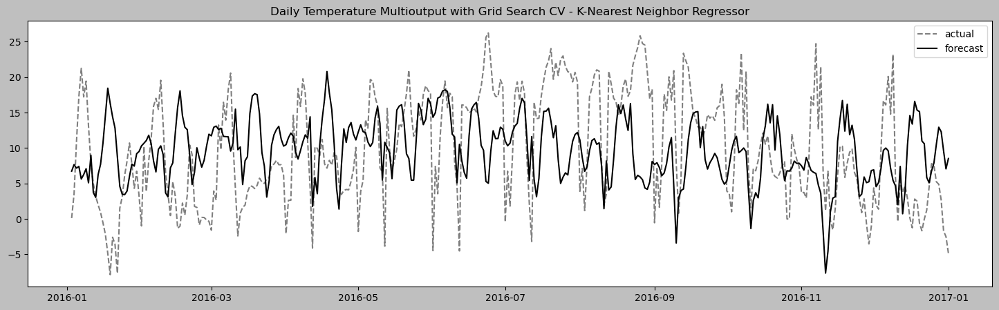

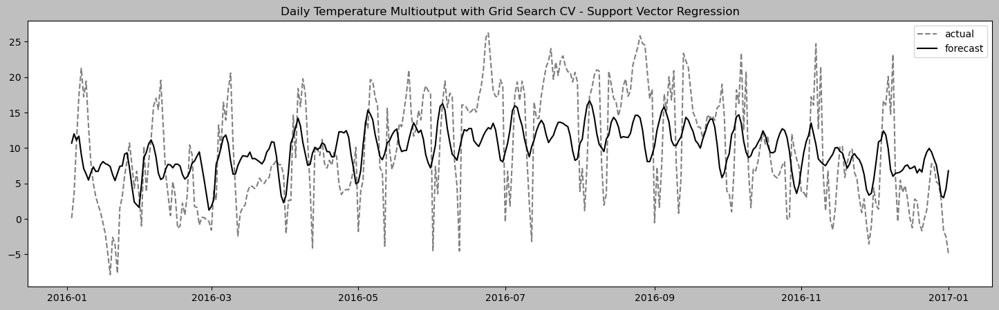

In [521]:
plot_results(dw_results_gs_df, 'Daily Temperature Multioutput with Grid Search CV')

## There is more

```python
from sktime.performance_metrics.forecasting import MeanSquaredError


gscv = ForecastingGridSearchCV(
    forecaster=forecaster,
    param_grid=param_grid,
    cv=cv,
    scoring=mse,
    verbose=1)
```

In [599]:
from sktime.registry import all_estimators
all_estimators("forecaster", as_dataframe=True)

,name,object
0,ARCH,<class 'sktime.forecasting.arch._uarch.ARCH'>
1,ARDL,<class 'sktime.forecasting.ardl.ARDL'>
2,ARIMA,<class 'sktime.forecasting.arima._pmdarima.ARI...
3,AutoARIMA,<class 'sktime.forecasting.arima._pmdarima.Aut...
4,AutoETS,<class 'sktime.forecasting.ets.AutoETS'>
...,...,...
94,VAR,<class 'sktime.forecasting.var.VAR'>
95,VARMAX,<class 'sktime.forecasting.varmax.VARMAX'>
96,VARReduce,<class 'sktime.forecasting.var_reduce.VARReduce'>
97,VECM,<class 'sktime.forecasting.vecm.VECM'>


In [600]:
all_estimators("metric", as_dataframe=True)

,name,object
0,AUCalibration,<class 'sktime.performance_metrics.forecasting...
1,CRPS,<class 'sktime.performance_metrics.forecasting...
2,ConstraintViolation,<class 'sktime.performance_metrics.forecasting...
3,EmpiricalCoverage,<class 'sktime.performance_metrics.forecasting...
4,GeometricMeanAbsoluteError,<class 'sktime.performance_metrics.forecasting...
5,GeometricMeanRelativeAbsoluteError,<class 'sktime.performance_metrics.forecasting...
6,GeometricMeanRelativeSquaredError,<class 'sktime.performance_metrics.forecasting...
7,GeometricMeanSquaredError,<class 'sktime.performance_metrics.forecasting...
8,IntervalWidth,<class 'sktime.performance_metrics.forecasting...
9,LogLoss,<class 'sktime.performance_metrics.forecasting...


# Recipe 6. Multivariate Forecasting and Ensemble Learning with sktime

In [829]:
from sktime.forecasting.all import (EnsembleForecaster, 
                                    NaiveForecaster)
# from sktime.datasets import load_macroeconomic

In [830]:
# load_macroeconomic().shape

In [831]:
# econ = load_macroeconomic()
# cols = ['realgdp','realdpi','tbilrate', 'unemp', 'infl']
# econ_df = econ[cols]

In [832]:
# econ_df.shape

In [833]:
# econ_df.plot(subplots=True, figsize=(16, 10));plt.show()

## How to do it

In [606]:
econ_df.head()

,realgdp,realdpi,tbilrate,unemp,infl
Period,,,,,
1959Q1,2710.349,1886.9,2.82,5.8,0.00
1959Q2,2778.801,1919.7,3.08,5.1,2.34
1959Q3,2775.488,1916.4,3.82,5.3,2.74
1959Q4,2785.204,1931.3,4.33,5.6,0.27
1960Q1,2847.699,1955.5,3.50,5.2,2.31


In [ ]:
# cond_deseason = ConditionalDeseasonalizer(sp=4)
# detrend = Detrender(forecaster=PolynomialTrendForecaster(degree=1))
# for col in econ_df:
#     econ_df[col] = cond_deseason.fit_transform(econ_df[col])
#     econ_df[col] = detrend.fit_transform(econ_df[col])

In [870]:
energy_ens = energy.copy()

In [871]:
energy_ens['month'] = energy_ens.index.month
energy_ens['year'] = energy_ens.index.year
energy_ens['dayofweek'] = energy_ens.index.dayofweek
print(energy_ens.head())

                   y  month  year  dayofweek
Month                                       
1973-01-01  1957.641      1  1973          0
1973-02-01  1712.143      2  1973          3
1973-03-01  1510.079      3  1973          3
1973-04-01  1183.421      4  1973          6
1973-05-01  1006.326      5  1973          1


In [872]:
# y = econ_df['unemp']
# exog = econ_df.drop(columns=['unemp'])
y = energy_ens['y']
exog = energy_ens.drop(columns=['y'])

In [873]:
y

Month
1973-01-01    1957.641
1973-02-01    1712.143
1973-03-01    1510.079
1973-04-01    1183.421
1973-05-01    1006.326
                ...   
2021-08-01    1755.212
2021-09-01    1456.901
2021-10-01    1315.799
2021-11-01    1644.306
2021-12-01    2032.352
Freq: MS, Name: y, Length: 588, dtype: float64

In [874]:
exog

,month,year,dayofweek
Month,,,
1973-01-01,1,1973,0
1973-02-01,2,1973,3
1973-03-01,3,1973,3
1973-04-01,4,1973,6
1973-05-01,5,1973,1
...,...,...,...
2021-08-01,8,2021,6
2021-09-01,9,2021,2
2021-10-01,10,2021,4


In [875]:
train, test, exog_train, exog_test = temporal_train_test_split(
                                                        y=y, 
                                                        X=exog, 
                                                        test_size=30)

In [876]:
train.shape

(558,)

In [877]:
exog_train.shape

(558, 3)

In [879]:
regressors = [
    ("Linear Regression", make_reduction(LinearRegression(), 
                                         strategy='multioutput')),
    ("Random Forest Regression", make_reduction(RandomForestRegressor(), 
                                                strategy='multioutput')),
    ("Support Vector Regression (RBF)", make_reduction(MultiOutputRegressor(SVR()), 
                                                       strategy='multioutput')),
    ("K-Nearest Neighbor Regression", make_reduction(KNeighborsRegressor(), 
                                                     strategy='multioutput')),
    ("Gradient Boosting Regression", make_reduction(MultiOutputRegressor(GradientBoostingRegressor()), 
                                                    strategy='multioutput'))]

In [808]:
# regressors = [
#     ("Linear Regression", make_reduction(LinearRegression(), strategy='direct')),
#     ("Random Forest Regression", make_reduction(RandomForestRegressor(), strategy='direct')),
#     ("Support Vector Regression (RBF)", make_reduction(SVR(), strategy='direct')),
#     ("K-Nearest Neighbor Regression", make_reduction(KNeighborsRegressor(), strategy='direct')),
#     ("Gradient Boosting Regression", make_reduction(GradientBoostingRegressor(), strategy='direct'))]

In [880]:
ensemble = EnsembleForecaster(regressors, aggfunc='mean')
naive = NaiveForecaster()
rf = make_reduction(RandomForestRegressor(), strategy='recursive')

In [810]:
ensemble 

EnsembleForecaster(forecasters=[('Linear Regression',
                                 MultioutputTabularRegressionForecaster(estimator=LinearRegression())),
                                ('Random Forest Regression',
                                 MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor())),
                                ('Support Vector Regression (RBF)',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()))),
                                ('K-Nearest Neighbor Regression',
                                 MultioutputTabularRegressionForecaster(estimator=KNeighborsRegressor())),
                                ('Gradient Boosting Regression',
                                 MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor())))])

In [881]:
fh = ForecastingHorizon(test.index, is_relative=None)

In [882]:
ensemble.fit(y=train, X=exog_train, fh=fh)
naive.fit(y=train, X=exog_train)
rf.fit(y=train, X=exog_train)

RecursiveTabularRegressionForecaster(estimator=RandomForestRegressor())

In [884]:
y_hat = pd.DataFrame(test).rename(columns={'unemp': 'actual'})
y_hat['EnsembleForecaster'] = ensemble.predict(fh=fh, X=exog_test)
y_hat['NaiveForecaster'] = naive.predict(fh=fh, X=exog_test)
y_hat['RandomForest'] = rf.predict(fh=fh, X=exog_test)
display(y_hat.head())

,y,EnsembleForecaster,NaiveForecaster,RandomForest
Month,,,,
2019-07-01,1734.089,1660.555498,1434.287,1723.84011
2019-08-01,1677.960,1625.982896,1434.287,1707.12032
2019-09-01,1466.196,1450.496951,1434.287,1438.12083
2019-10-01,1374.674,1421.767419,1434.287,1352.83945
2019-11-01,1809.114,1638.217535,1434.287,1686.42632


In [886]:
print('NaiveForecaster', mase(test, y_hat['NaiveForecaster'], y_train=train))
print('EnsembleForecaster', mase(test, y_hat['EnsembleForecaster'], y_train=train))
print('RandomForestRegression', mase(test, y_hat['RandomForest'], y_train=train))

NaiveForecaster 1.3822824614250524
EnsembleForecaster 0.33278150816939045
RandomForestRegression 0.33694468011991524


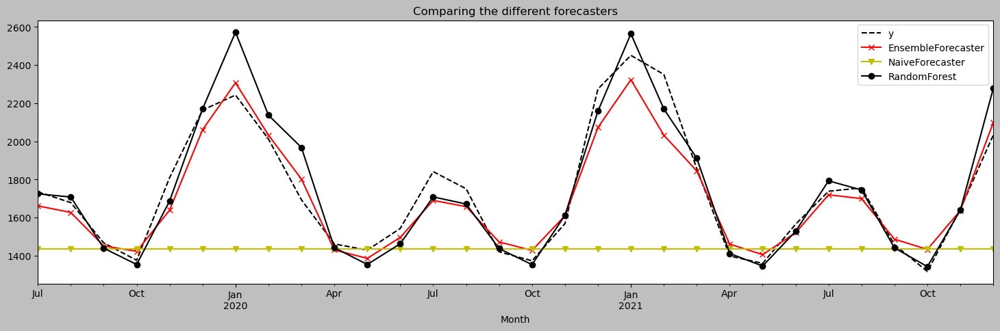

In [888]:
styles = ['k--','rx-','yv-', '-o']
for col, s in zip(y_hat, styles):
    y_hat[col].plot(style=s, label=col, 
                    title='Comparing the different forecasters')
plt.legend()
plt.show()
#plt.savefig('../../../Packt-Time-Series-Cookbook/Chapters/Ch12/images/fig_12.18.png', bbox_inches='tight', dpi=600)

## There is more

In [889]:
regressors

[('Linear Regression',
  MultioutputTabularRegressionForecaster(estimator=LinearRegression())),
 ('Random Forest Regression',
  MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor())),
 ('Support Vector Regression (RBF)',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()))),
 ('K-Nearest Neighbor Regression',
  MultioutputTabularRegressionForecaster(estimator=KNeighborsRegressor())),
 ('Gradient Boosting Regression',
  MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor())))]

In [890]:
train

Month
1973-01-01    1957.641
1973-02-01    1712.143
1973-03-01    1510.079
1973-04-01    1183.421
1973-05-01    1006.326
                ...   
2019-02-01    2156.175
2019-03-01    2002.936
2019-04-01    1361.874
2019-05-01    1356.223
2019-06-01    1434.287
Freq: MS, Name: y, Length: 558, dtype: float64

In [891]:
from sktime.forecasting.compose import AutoEnsembleForecaster

auto = AutoEnsembleForecaster(forecasters=regressors,
                              method='feature-importance')
auto.fit(y=train, X=exog_train, fh=fh)

AutoEnsembleForecaster(forecasters=[('Linear Regression',
                                     MultioutputTabularRegressionForecaster(estimator=LinearRegression())),
                                    ('Random Forest Regression',
                                     MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor())),
                                    ('Support Vector Regression (RBF)',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()))),
                                    ('K-Nearest Neighbor Regression',
                                     MultioutputTabularRegressionForecaster(estimator=KNeighborsRegressor())),
                                    ('Gradient Boosting Regression',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor())))])

In [893]:
auto

AutoEnsembleForecaster(forecasters=[('Linear Regression',
                                     MultioutputTabularRegressionForecaster(estimator=LinearRegression())),
                                    ('Random Forest Regression',
                                     MultioutputTabularRegressionForecaster(estimator=RandomForestRegressor())),
                                    ('Support Vector Regression (RBF)',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=SVR()))),
                                    ('K-Nearest Neighbor Regression',
                                     MultioutputTabularRegressionForecaster(estimator=KNeighborsRegressor())),
                                    ('Gradient Boosting Regression',
                                     MultioutputTabularRegressionForecaster(estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor())))])

In [892]:
auto.weights_

[0.44746933882378337,
 0.4208957009467293,
 0.0861348814867026,
 0.02395257262362549,
 0.02154750611915922]

In [894]:
for reg, w in zip(regressors, auto.weights_):
    print(f'{reg[0]} weight = {w}')

Linear Regression weight = 0.44746933882378337
Random Forest Regression weight = 0.4208957009467293
Support Vector Regression (RBF) weight = 0.0861348814867026
K-Nearest Neighbor Regression weight = 0.02395257262362549
Gradient Boosting Regression weight = 0.02154750611915922


In [896]:
y_hat['AutoEnsembleForecaster'] = auto.predict(fh=fh, X=exog_test)

In [898]:
cols = ['y', 'EnsembleForecaster', 'AutoEnsembleForecaster']
print(y_hat[cols].head())

                   y  EnsembleForecaster  AutoEnsembleForecaster
Month                                                           
2019-07-01  1734.089         1660.555498             1690.211553
2019-08-01  1677.960         1625.982896             1665.087175
2019-09-01  1466.196         1450.496951             1454.047496
2019-10-01  1374.674         1421.767419             1418.009047
2019-11-01  1809.114         1638.217535             1685.890819


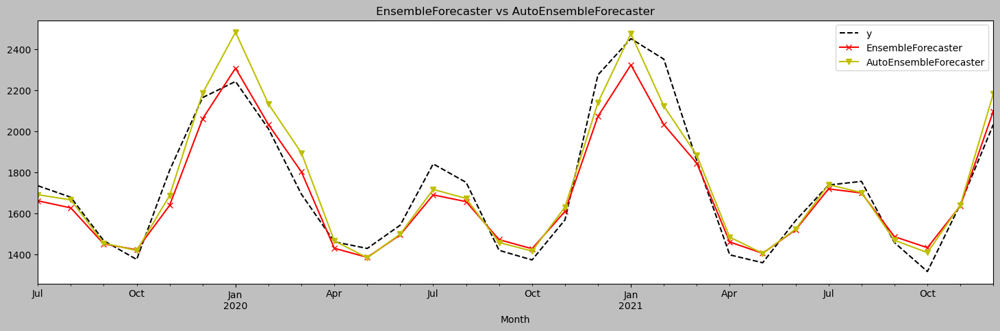

In [899]:
styles = ['k--','rx-','yv-']
forecasts = y_hat[cols]

for model_name, style in zip(forecasts, styles):
    forecasts[model_name].plot(style=style, label=model_name, 
                    title='EnsembleForecaster vs AutoEnsembleForecaster')
plt.legend()
plt.show()

In [900]:
print('AutoEnsembleForecaster', 
      mase(test, forecasts['AutoEnsembleForecaster'], y_train=train))
print('EnsembleForecaster', 
      mase(test, forecasts['EnsembleForecaster'], y_train=train))

AutoEnsembleForecaster 0.3156648908933739
EnsembleForecaster 0.33278150816939045


# Recipe 7: Forecasting with MLForecast (Optional)

In [16]:
energy_ml = energy.copy()

In [19]:
energy_ml.head()

,y
Month,
1973-01-01,1957.641
1973-02-01,1712.143
1973-03-01,1510.079
1973-04-01,1183.421
1973-05-01,1006.326


In [13]:
from mlforecast import MLForecast
from mlforecast.lag_transforms import ExpandingMean, RollingMean
from mlforecast.target_transforms import Differences

from sklearn.linear_model import (LinearRegression, 
                                 ElasticNet, 
                                 Ridge, 
                                 Lasso, 
                                 HuberRegressor)
from sklearn.ensemble import (RandomForestRegressor,
                             GradientBoostingRegressor,
                             ExtraTreesRegressor)
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

In [17]:
regressors = [
    LinearRegression,
    RandomForestRegressor(n_estimators=100),
    GradientBoostingRegressor(n_estimators=100),
    ExtraTreesRegressor(n_estimators=100),
    SVR(kernel='rbf'),
    SVR(kernel='linear'),
    KNeighborsRegressor(n_neighbors=5)
]